<a href="https://colab.research.google.com/github/QuadDarv1ne/maestro7it_education/blob/main/radio_signals_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

✅ Библиотеки успешно загружены!

АМПЛИТУДНАЯ МОДУЛЯЦИЯ (AM)


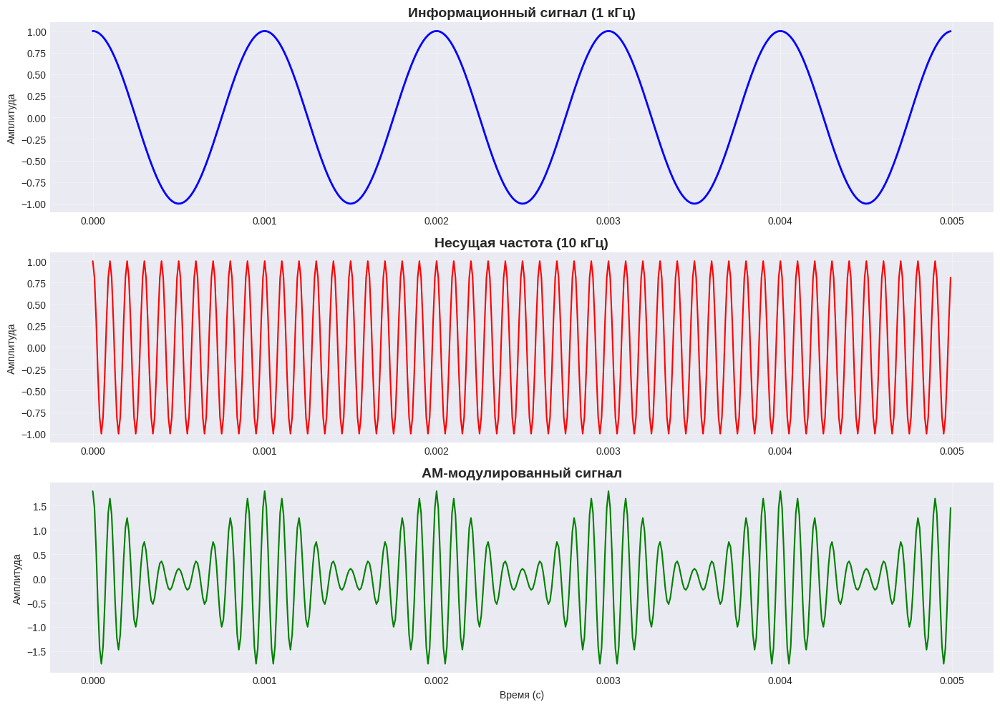

✓ Частота дискретизации: 100 кГц
✓ Несущая частота: 10 кГц
✓ Частота модуляции: 1 кГц

ЧАСТОТНАЯ МОДУЛЯЦИЯ (FM)


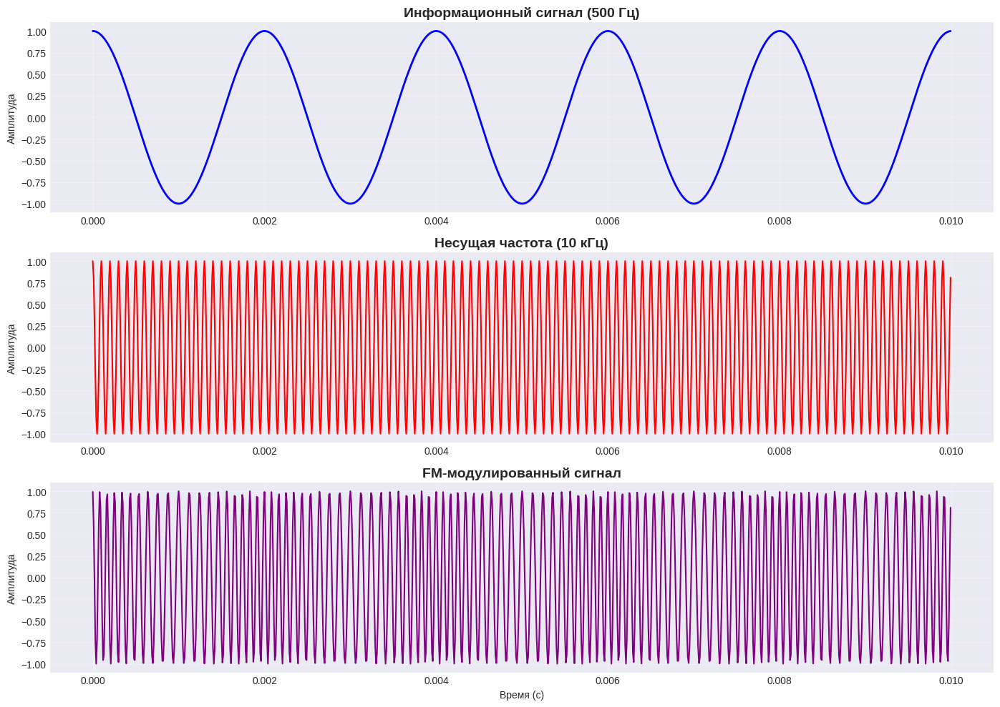

✓ Несущая частота: 10 кГц
✓ Девиация частоты: 2 кГц

СПЕКТРАЛЬНЫЙ АНАЛИЗ

📊 Спектр AM-сигнала:


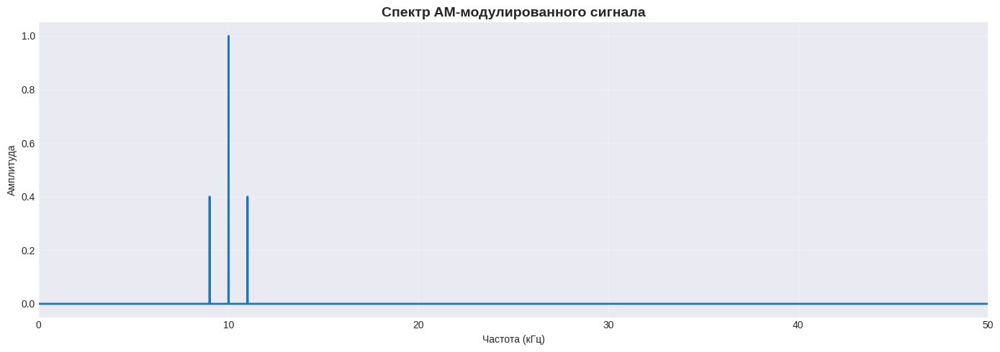


📊 Спектр FM-сигнала:


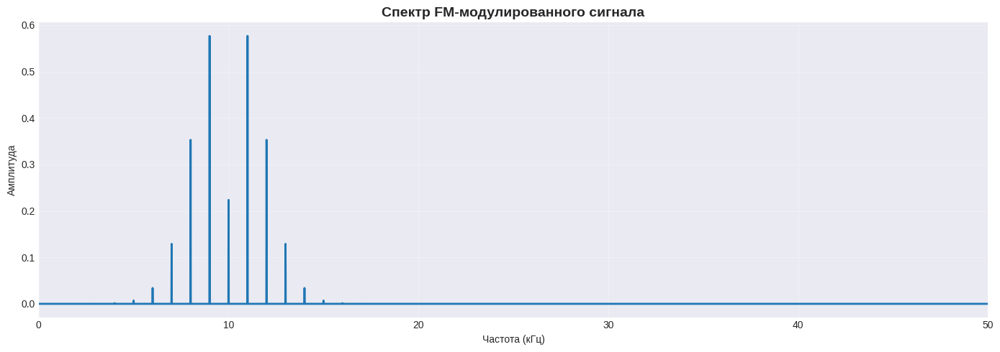

ФИЛЬТРАЦИЯ СИГНАЛОВ


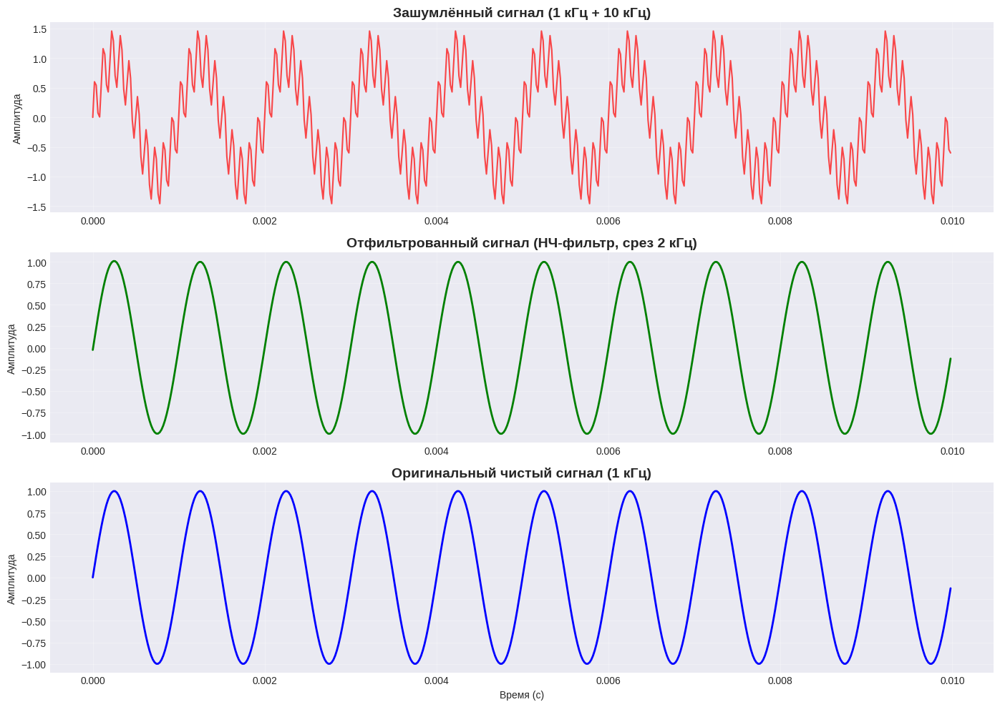

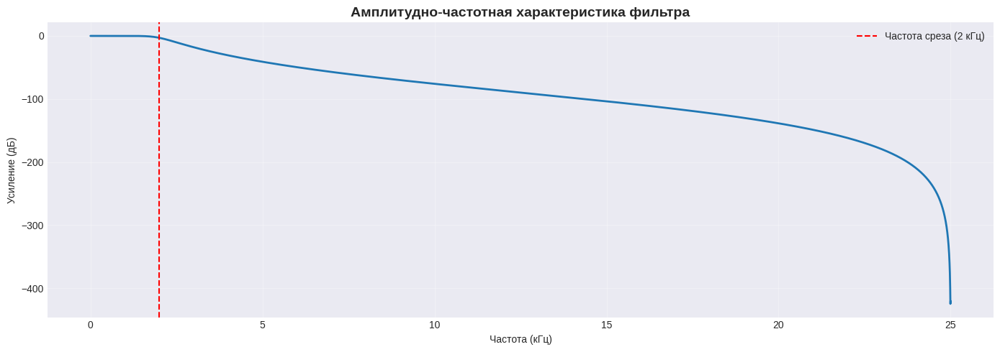

✓ Порядок фильтра: 5
✓ Частота среза: 2 кГц

СПЕКТРОГРАММА (ВРЕМЕННО-ЧАСТОТНЫЙ АНАЛИЗ)


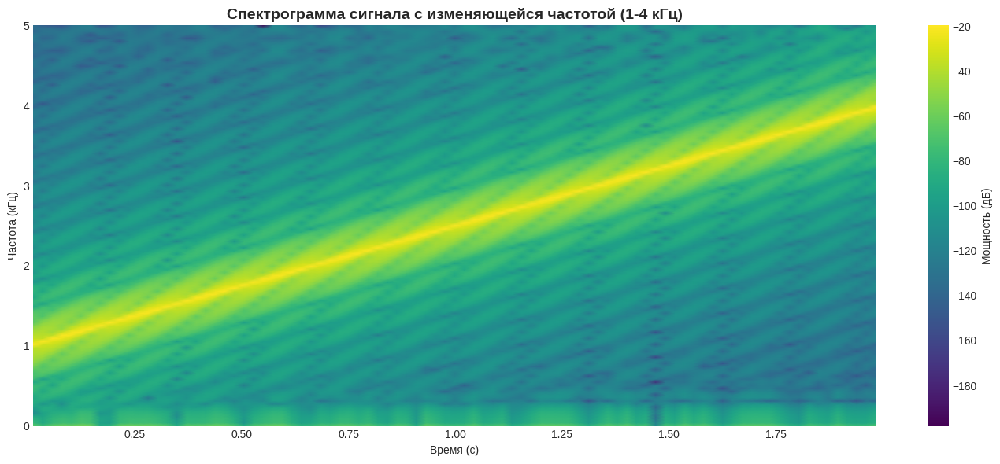

✓ Начальная частота: 1 кГц
✓ Конечная частота: 4 кГц


СПРАВОЧНАЯ ИНФОРМАЦИЯ О РАДИОЧАСТОТНЫХ ДИАПАЗОНАХ

📡 AM-радио                  → 530-1700 кГц (MF)
📡 FM-радио                  → 88-108 МГц (VHF)
📡 Авиационная связь         → 118-137 МГц (VHF)
📡 Wi-Fi                     → 2.4 ГГц и 5-6 ГГц (UHF/SHF)
📡 Bluetooth                 → 2.4 ГГц
📡 GPS L1                    → 1.575 ГГц
📡 GSM 900                   → 900 МГц (UHF)
📡 GSM 1800                  → 1800 МГц (UHF)
📡 5G                        → 600 МГц - 39 ГГц


✅ Все примеры успешно выполнены!
💡 Совет: Измените параметры в функциях для экспериментов с разными сигналами.


In [ ]:
"""
Работа с радиочастотами и обработкой сигналов в Google Colab
Практические примеры генерации, модуляции и анализа радиосигналов
"""

# ============================================================================
# УСТАНОВКА БИБЛИОТЕК
# ============================================================================

# Устанавливаем необходимые библиотеки
!pip install scipy numpy matplotlib -q

import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.fft import fft, fftfreq
import warnings
warnings.filterwarnings('ignore')

# Настройка графиков
plt.style.use('seaborn-v0_8-darkgrid')
plt.rcParams['figure.figsize'] = (14, 8)
plt.rcParams['font.size'] = 10

print("✅ Библиотеки успешно загружены!\n")

# ============================================================================
# 1. ГЕНЕРАЦИЯ БАЗОВЫХ СИГНАЛОВ
# ============================================================================

def generate_carrier(fc, fs, duration):
    """Генерация несущей частоты"""
    t = np.arange(0, duration, 1/fs)
    carrier = np.cos(2 * np.pi * fc * t)
    return t, carrier

def generate_message(fm, fs, duration):
    """Генерация информационного сигнала"""
    t = np.arange(0, duration, 1/fs)
    message = np.cos(2 * np.pi * fm * t)
    return t, message

# ============================================================================
# 2. АМПЛИТУДНАЯ МОДУЛЯЦИЯ (AM)
# ============================================================================

def am_modulation(message, carrier, modulation_index=0.5):
    """AM модуляция"""
    am_signal = (1 + modulation_index * message) * carrier
    return am_signal

def plot_am_modulation():
    """Визуализация AM модуляции"""
    print("=" * 60)
    print("АМПЛИТУДНАЯ МОДУЛЯЦИЯ (AM)")
    print("=" * 60)

    # Параметры
    fs = 100e3  # Частота дискретизации
    fc = 10e3   # Несущая частота (10 кГц)
    fm = 1e3    # Частота сообщения (1 кГц)
    duration = 0.01  # Длительность (10 мс)

    # Генерация сигналов
    t, carrier = generate_carrier(fc, fs, duration)
    _, message = generate_message(fm, fs, duration)
    am_signal = am_modulation(message, carrier, modulation_index=0.8)

    # Построение графиков
    fig, axes = plt.subplots(3, 1, figsize=(14, 10))

    # Информационный сигнал
    axes[0].plot(t[:500], message[:500], 'b', linewidth=2)
    axes[0].set_title('Информационный сигнал (1 кГц)', fontsize=14, fontweight='bold')
    axes[0].set_ylabel('Амплитуда')
    axes[0].grid(True, alpha=0.3)

    # Несущая частота
    axes[1].plot(t[:500], carrier[:500], 'r', linewidth=1.5)
    axes[1].set_title('Несущая частота (10 кГц)', fontsize=14, fontweight='bold')
    axes[1].set_ylabel('Амплитуда')
    axes[1].grid(True, alpha=0.3)

    # AM-модулированный сигнал
    axes[2].plot(t[:500], am_signal[:500], 'g', linewidth=1.5)
    axes[2].set_title('AM-модулированный сигнал', fontsize=14, fontweight='bold')
    axes[2].set_xlabel('Время (с)')
    axes[2].set_ylabel('Амплитуда')
    axes[2].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    print(f"✓ Частота дискретизации: {fs/1e3:.0f} кГц")
    print(f"✓ Несущая частота: {fc/1e3:.0f} кГц")
    print(f"✓ Частота модуляции: {fm/1e3:.0f} кГц\n")

plot_am_modulation()

# ============================================================================
# 3. ЧАСТОТНАЯ МОДУЛЯЦИЯ (FM)
# ============================================================================

def fm_modulation(message, carrier_freq, fs, frequency_deviation):
    """FM модуляция"""
    t = np.arange(len(message)) / fs
    # Интегрируем сообщение для получения фазы
    phase = 2 * np.pi * frequency_deviation * np.cumsum(message) / fs
    fm_signal = np.cos(2 * np.pi * carrier_freq * t + phase)
    return fm_signal

def plot_fm_modulation():
    """Визуализация FM модуляции"""
    print("=" * 60)
    print("ЧАСТОТНАЯ МОДУЛЯЦИЯ (FM)")
    print("=" * 60)

    # Параметры
    fs = 100e3
    fc = 10e3
    fm = 500
    duration = 0.02
    freq_dev = 2e3  # Девиация частоты

    t, carrier = generate_carrier(fc, fs, duration)
    _, message = generate_message(fm, fs, duration)
    fm_signal = fm_modulation(message, fc, fs, freq_dev)

    # Построение графиков
    fig, axes = plt.subplots(3, 1, figsize=(14, 10))

    axes[0].plot(t[:1000], message[:1000], 'b', linewidth=2)
    axes[0].set_title('Информационный сигнал (500 Гц)', fontsize=14, fontweight='bold')
    axes[0].set_ylabel('Амплитуда')
    axes[0].grid(True, alpha=0.3)

    axes[1].plot(t[:1000], carrier[:1000], 'r', linewidth=1.5)
    axes[1].set_title('Несущая частота (10 кГц)', fontsize=14, fontweight='bold')
    axes[1].set_ylabel('Амплитуда')
    axes[1].grid(True, alpha=0.3)

    axes[2].plot(t[:1000], fm_signal[:1000], 'purple', linewidth=1.5)
    axes[2].set_title('FM-модулированный сигнал', fontsize=14, fontweight='bold')
    axes[2].set_xlabel('Время (с)')
    axes[2].set_ylabel('Амплитуда')
    axes[2].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    print(f"✓ Несущая частота: {fc/1e3:.0f} кГц")
    print(f"✓ Девиация частоты: {freq_dev/1e3:.0f} кГц\n")

plot_fm_modulation()

# ============================================================================
# 4. СПЕКТРАЛЬНЫЙ АНАЛИЗ (FFT)
# ============================================================================

def plot_spectrum(signal_data, fs, title):
    """Построение спектра сигнала"""
    N = len(signal_data)
    yf = fft(signal_data)
    xf = fftfreq(N, 1/fs)[:N//2]

    plt.figure(figsize=(14, 5))
    plt.plot(xf/1e3, 2.0/N * np.abs(yf[:N//2]), linewidth=2)
    plt.title(title, fontsize=14, fontweight='bold')
    plt.xlabel('Частота (кГц)')
    plt.ylabel('Амплитуда')
    plt.grid(True, alpha=0.3)
    plt.xlim([0, fs/2e3])
    plt.tight_layout()
    plt.show()

def spectrum_analysis():
    """Спектральный анализ AM и FM сигналов"""
    print("=" * 60)
    print("СПЕКТРАЛЬНЫЙ АНАЛИЗ")
    print("=" * 60)

    fs = 100e3
    fc = 10e3
    fm = 1e3
    duration = 0.1

    t, carrier = generate_carrier(fc, fs, duration)
    _, message = generate_message(fm, fs, duration)
    am_signal = am_modulation(message, carrier, 0.8)
    fm_signal = fm_modulation(message, fc, fs, 2e3)

    print("\n📊 Спектр AM-сигнала:")
    plot_spectrum(am_signal, fs, 'Спектр AM-модулированного сигнала')

    print("\n📊 Спектр FM-сигнала:")
    plot_spectrum(fm_signal, fs, 'Спектр FM-модулированного сигнала')

spectrum_analysis()

# ============================================================================
# 5. ФИЛЬТРАЦИЯ СИГНАЛОВ
# ============================================================================

def design_and_apply_filter():
    """Проектирование и применение фильтров"""
    print("=" * 60)
    print("ФИЛЬТРАЦИЯ СИГНАЛОВ")
    print("=" * 60)

    # Создаём сигнал с шумом
    fs = 50e3
    duration = 1.0
    t = np.arange(0, duration, 1/fs)

    # Полезный сигнал (1 кГц) + шум (10 кГц)
    signal_clean = np.sin(2 * np.pi * 1e3 * t)
    noise = 0.5 * np.sin(2 * np.pi * 10e3 * t)
    signal_noisy = signal_clean + noise

    # Проектирование низкочастотного фильтра (отсекает шум)
    nyquist = fs / 2
    cutoff = 2e3  # Частота среза 2 кГц
    order = 5
    b, a = signal.butter(order, cutoff/nyquist, btype='low')

    # Применение фильтра
    signal_filtered = signal.filtfilt(b, a, signal_noisy)

    # Построение графиков
    fig, axes = plt.subplots(3, 1, figsize=(14, 10))

    axes[0].plot(t[:500], signal_noisy[:500], 'r', linewidth=1.5, alpha=0.7)
    axes[0].set_title('Зашумлённый сигнал (1 кГц + 10 кГц)', fontsize=14, fontweight='bold')
    axes[0].set_ylabel('Амплитуда')
    axes[0].grid(True, alpha=0.3)

    axes[1].plot(t[:500], signal_filtered[:500], 'g', linewidth=2)
    axes[1].set_title('Отфильтрованный сигнал (НЧ-фильтр, срез 2 кГц)', fontsize=14, fontweight='bold')
    axes[1].set_ylabel('Амплитуда')
    axes[1].grid(True, alpha=0.3)

    axes[2].plot(t[:500], signal_clean[:500], 'b', linewidth=2)
    axes[2].set_title('Оригинальный чистый сигнал (1 кГц)', fontsize=14, fontweight='bold')
    axes[2].set_xlabel('Время (с)')
    axes[2].set_ylabel('Амплитуда')
    axes[2].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # АЧХ фильтра
    w, h = signal.freqz(b, a, worN=8000)
    plt.figure(figsize=(14, 5))
    plt.plot(w * fs / (2 * np.pi) / 1e3, 20 * np.log10(abs(h)), linewidth=2)
    plt.title('Амплитудно-частотная характеристика фильтра', fontsize=14, fontweight='bold')
    plt.xlabel('Частота (кГц)')
    plt.ylabel('Усиление (дБ)')
    plt.grid(True, alpha=0.3)
    plt.axvline(cutoff/1e3, color='r', linestyle='--', label=f'Частота среза ({cutoff/1e3:.0f} кГц)')
    plt.legend()
    plt.tight_layout()
    plt.show()

    print(f"✓ Порядок фильтра: {order}")
    print(f"✓ Частота среза: {cutoff/1e3:.0f} кГц\n")

design_and_apply_filter()

# ============================================================================
# 6. СПЕКТРОГРАММА (ВРЕМЕННО-ЧАСТОТНЫЙ АНАЛИЗ)
# ============================================================================

def plot_spectrogram():
    """Построение спектрограммы сигнала с изменяющейся частотой"""
    print("=" * 60)
    print("СПЕКТРОГРАММА (ВРЕМЕННО-ЧАСТОТНЫЙ АНАЛИЗ)")
    print("=" * 60)

    fs = 10e3
    duration = 2.0
    t = np.arange(0, duration, 1/fs)

    # Создаём сигнал с линейно изменяющейся частотой (chirp)
    f0, f1 = 1e3, 4e3
    chirp_signal = signal.chirp(t, f0, duration, f1, method='linear')

    # Построение спектрограммы
    f, t_spec, Sxx = signal.spectrogram(chirp_signal, fs, nperseg=256)

    plt.figure(figsize=(14, 6))
    plt.pcolormesh(t_spec, f/1e3, 10 * np.log10(Sxx), shading='gouraud', cmap='viridis')
    plt.colorbar(label='Мощность (дБ)')
    plt.title('Спектрограмма сигнала с изменяющейся частотой (1-4 кГц)',
              fontsize=14, fontweight='bold')
    plt.xlabel('Время (с)')
    plt.ylabel('Частота (кГц)')
    plt.ylim([0, 5])
    plt.tight_layout()
    plt.show()

    print(f"✓ Начальная частота: {f0/1e3:.0f} кГц")
    print(f"✓ Конечная частота: {f1/1e3:.0f} кГц\n")

plot_spectrogram()

# ============================================================================
# 7. СПРАВОЧНАЯ ИНФОРМАЦИЯ О ЧАСТОТАХ
# ============================================================================

def print_frequency_bands():
    """Вывод справочной информации о диапазонах частот"""
    print("\n" + "=" * 60)
    print("СПРАВОЧНАЯ ИНФОРМАЦИЯ О РАДИОЧАСТОТНЫХ ДИАПАЗОНАХ")
    print("=" * 60 + "\n")

    bands = {
        "AM-радио": "530-1700 кГц (MF)",
        "FM-радио": "88-108 МГц (VHF)",
        "Авиационная связь": "118-137 МГц (VHF)",
        "Wi-Fi": "2.4 ГГц и 5-6 ГГц (UHF/SHF)",
        "Bluetooth": "2.4 ГГц",
        "GPS L1": "1.575 ГГц",
        "GSM 900": "900 МГц (UHF)",
        "GSM 1800": "1800 МГц (UHF)",
        "5G": "600 МГц - 39 ГГц",
    }

    for service, freq in bands.items():
        print(f"📡 {service:25s} → {freq}")

    print("\n" + "=" * 60)

print_frequency_bands()

print("\n✅ Все примеры успешно выполнены!")
print("💡 Совет: Измените параметры в функциях для экспериментов с разными сигналами.")

ПРИМЕР 1: БАЗОВЫЙ ПЕРЕХВАТЧИК
✓ Добавлена цель: FM Radio на 100.500 МГц
✓ Добавлена цель: Aviation Band на 121.500 МГц
✓ Добавлена цель: Amateur Radio на 145.500 МГц

🔍 Начинаем перехват сигналов...
📊 Частота дискретизации: 20.0 МГц
⏱️  Длительность захвата: 50.0 мс
🎯 Целей для мониторинга: 3



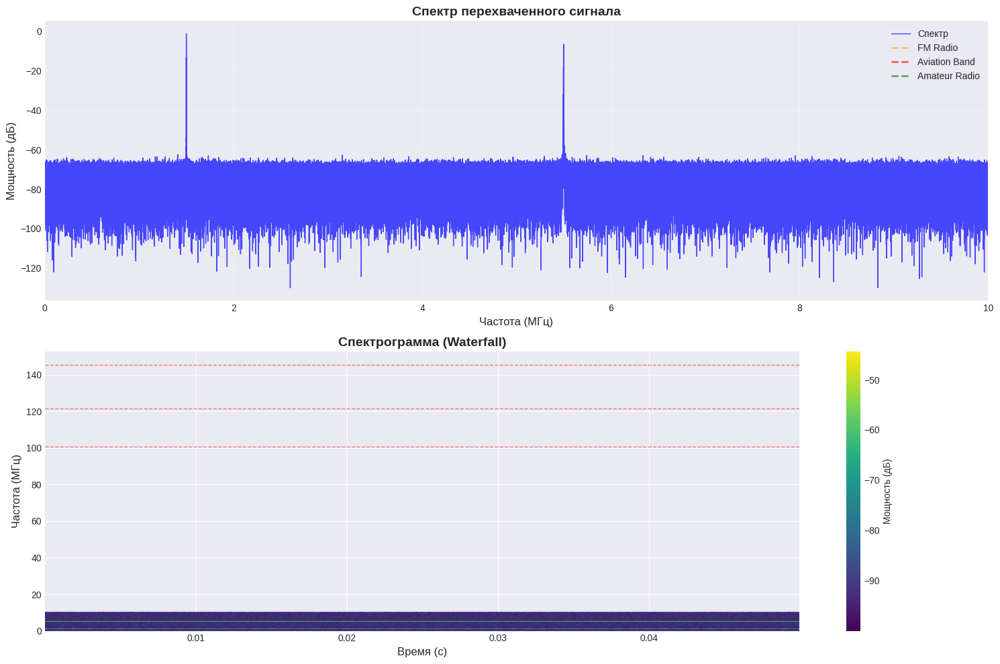


ОТЧЁТ О ПЕРЕХВАТЕ СИГНАЛОВ
❌ Сигналы не обнаружены


ПРИМЕР 2: СИСТЕМА РАДИОРАЗВЕДКИ
✓ Добавлена цель: Emergency 121.5 на 121.500 МГц
✓ Добавлена цель: Police Band на 155.500 МГц
✓ Добавлена цель: Military UHF на 225.000 МГц
✓ Добавлена цель: Satellite Uplink на 435.000 МГц
✓ Добавлена цель: ISM 433 MHz на 433.920 МГц

🔍 Начинаем перехват сигналов...
📊 Частота дискретизации: 50.0 МГц
⏱️  Длительность захвата: 100.0 мс
🎯 Целей для мониторинга: 5



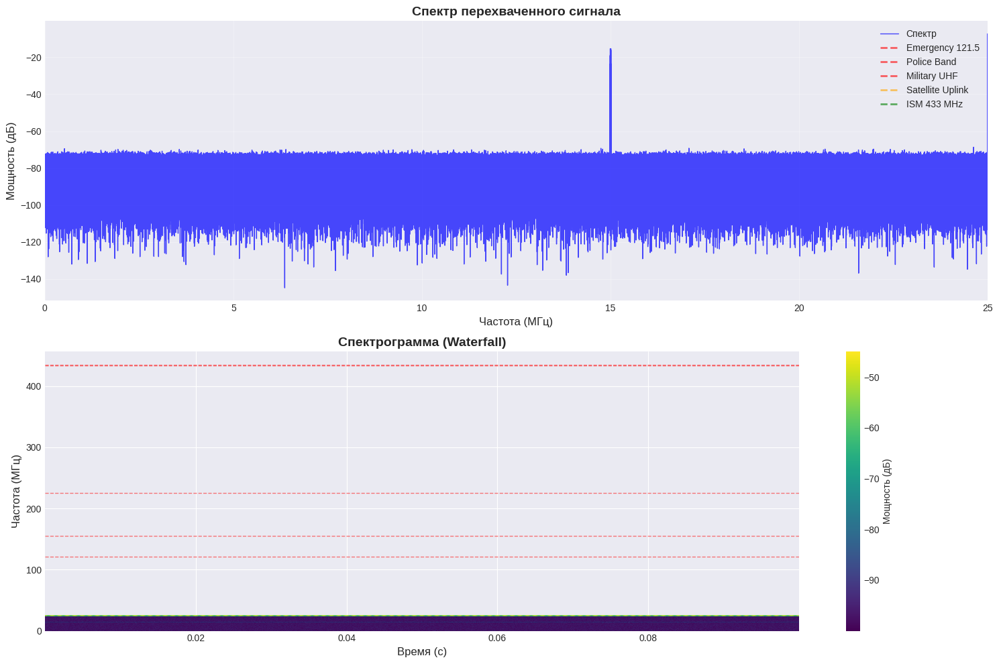


ОТЧЁТ О ПЕРЕХВАТЕ СИГНАЛОВ
❌ Сигналы не обнаружены


ПРИМЕР 3: МОНИТОРИНГ ПОЛЬЗОВАТЕЛЬСКИХ ЧАСТОТ
✓ Добавлена цель: WiFi Ch1 на 2412.000 МГц
✓ Добавлена цель: Bluetooth на 2440.000 МГц
⚠️  Внимание: Для реальных частот 2.4 ГГц требуется специальное оборудование
    Этот пример использует симуляцию с пониженными частотами


✅ Все примеры выполнены!

💡 Совет: Измените частоты, приоритеты и параметры для ваших задач
⚠️  Напоминание: Перехват радиосигналов регулируется законом!


In [ ]:
"""
Перехватчик радиочастот - мониторинг и анализ заданных диапазонов
Симуляция перехвата сигналов на определённых частотах
"""

import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.fft import fft, fftfreq
from dataclasses import dataclass
from typing import List, Tuple
import warnings
warnings.filterwarnings('ignore')

plt.style.use('seaborn-v0_8-darkgrid')
plt.rcParams['figure.figsize'] = (15, 10)

# ============================================================================
# КОНФИГУРАЦИЯ ПЕРЕХВАТЧИКА
# ============================================================================

@dataclass
class FrequencyTarget:
    """Целевая частота для мониторинга"""
    name: str
    frequency: float  # Гц
    bandwidth: float  # Гц
    modulation: str  # 'AM', 'FM', 'NONE'
    priority: int  # 1-5 (5 - высший)

@dataclass
class SignalDetection:
    """Обнаруженный сигнал"""
    frequency: float
    power: float
    snr: float  # Signal-to-Noise Ratio
    timestamp: float
    target_name: str = "Unknown"

# ============================================================================
# КЛАСС ПЕРЕХВАТЧИКА
# ============================================================================

class RFInterceptor:
    """Перехватчик радиочастот"""

    def __init__(self, sample_rate=10e6, duration=0.1):
        """
        Инициализация перехватчика

        Args:
            sample_rate: Частота дискретизации (Гц)
            duration: Длительность захвата (секунды)
        """
        self.fs = sample_rate
        self.duration = duration
        self.targets = []
        self.detections = []

    def add_target(self, target: FrequencyTarget):
        """Добавить целевую частоту для мониторинга"""
        self.targets.append(target)
        print(f"✓ Добавлена цель: {target.name} на {target.frequency/1e6:.3f} МГц")

    def generate_test_environment(self) -> np.ndarray:
        """Генерация тестовой радиосреды с несколькими сигналами"""
        t = np.arange(0, self.duration, 1/self.fs)
        environment = np.zeros(len(t))

        # Добавляем шум
        noise_level = 0.1
        environment += noise_level * np.random.randn(len(t))

        # Добавляем сигналы на целевых частотах
        for target in self.targets:
            # Случайно решаем, есть ли сигнал (70% вероятность)
            if np.random.random() < 0.7:
                amplitude = np.random.uniform(0.5, 2.0)

                if target.modulation == 'AM':
                    # AM сигнал
                    carrier = amplitude * np.cos(2 * np.pi * target.frequency * t)
                    modulation = 0.5 * np.cos(2 * np.pi * 1e3 * t)
                    signal_component = (1 + modulation) * carrier
                elif target.modulation == 'FM':
                    # FM сигнал
                    freq_dev = target.bandwidth * 0.1
                    modulation = np.cos(2 * np.pi * 1e3 * t)
                    phase = 2 * np.pi * freq_dev * np.cumsum(modulation) / self.fs
                    signal_component = amplitude * np.cos(2 * np.pi * target.frequency * t + phase)
                else:
                    # Немодулированная несущая
                    signal_component = amplitude * np.cos(2 * np.pi * target.frequency * t)

                environment += signal_component

        return environment

    def scan_spectrum(self, signal_data: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
        """Сканирование спектра"""
        N = len(signal_data)
        yf = fft(signal_data)
        xf = fftfreq(N, 1/self.fs)[:N//2]
        power = 2.0/N * np.abs(yf[:N//2])
        return xf, power

    def detect_signals(self, signal_data: np.ndarray, threshold_db=-20):
        """Обнаружение сигналов на целевых частотах"""
        xf, power = self.scan_spectrum(signal_data)
        power_db = 20 * np.log10(power + 1e-10)

        # Оценка уровня шума
        noise_floor = np.median(power_db)

        self.detections = []

        for target in self.targets:
            # Находим индексы в диапазоне целевой частоты
            freq_range = target.bandwidth / 2
            mask = (xf >= target.frequency - freq_range) & (xf <= target.frequency + freq_range)

            if not np.any(mask):
                continue

            # Максимальная мощность в диапазоне
            max_power_db = np.max(power_db[mask])
            max_freq = xf[mask][np.argmax(power_db[mask])]

            # SNR
            snr = max_power_db - noise_floor

            # Проверка порога обнаружения
            if max_power_db > threshold_db and snr > 3:
                detection = SignalDetection(
                    frequency=max_freq,
                    power=max_power_db,
                    snr=snr,
                    timestamp=0,
                    target_name=target.name
                )
                self.detections.append(detection)

        return self.detections

    def apply_bandpass_filter(self, signal_data: np.ndarray,
                             center_freq: float, bandwidth: float) -> np.ndarray:
        """Применение полосового фильтра"""
        nyquist = self.fs / 2
        low = (center_freq - bandwidth/2) / nyquist
        high = (center_freq + bandwidth/2) / nyquist

        # Ограничиваем диапазон [0, 1)
        low = max(0.001, min(low, 0.999))
        high = max(0.001, min(high, 0.999))

        if low >= high:
            return signal_data

        b, a = signal.butter(4, [low, high], btype='band')
        filtered = signal.filtfilt(b, a, signal_data)
        return filtered

    def demodulate_am(self, signal_data: np.ndarray) -> np.ndarray:
        """Демодуляция AM сигнала (детектор огибающей)"""
        analytic_signal = signal.hilbert(signal_data)
        envelope = np.abs(analytic_signal)
        return envelope

    def visualize_spectrum(self, signal_data: np.ndarray):
        """Визуализация спектра с отмеченными целями"""
        xf, power = self.scan_spectrum(signal_data)
        power_db = 20 * np.log10(power + 1e-10)

        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

        # Спектр
        ax1.plot(xf/1e6, power_db, 'b-', linewidth=1, alpha=0.7, label='Спектр')
        ax1.set_xlabel('Частота (МГц)', fontsize=12)
        ax1.set_ylabel('Мощность (дБ)', fontsize=12)
        ax1.set_title('Спектр перехваченного сигнала', fontsize=14, fontweight='bold')
        ax1.grid(True, alpha=0.3)
        ax1.set_xlim([0, self.fs/2e6])

        # Отмечаем целевые частоты
        for target in self.targets:
            color = 'red' if target.priority >= 4 else 'orange' if target.priority >= 3 else 'green'
            ax1.axvline(target.frequency/1e6, color=color, linestyle='--',
                       alpha=0.6, linewidth=2, label=f'{target.name}')
            ax1.axvspan((target.frequency - target.bandwidth/2)/1e6,
                       (target.frequency + target.bandwidth/2)/1e6,
                       alpha=0.1, color=color)

        ax1.legend(loc='upper right')

        # Waterfall (спектрограмма)
        f, t, Sxx = signal.spectrogram(signal_data, self.fs, nperseg=1024)
        im = ax2.pcolormesh(t, f/1e6, 10 * np.log10(Sxx + 1e-10),
                           shading='gouraud', cmap='viridis')
        ax2.set_ylabel('Частота (МГц)', fontsize=12)
        ax2.set_xlabel('Время (с)', fontsize=12)
        ax2.set_title('Спектрограмма (Waterfall)', fontsize=14, fontweight='bold')
        plt.colorbar(im, ax=ax2, label='Мощность (дБ)')

        # Отмечаем цели на спектрограмме
        for target in self.targets:
            ax2.axhline(target.frequency/1e6, color='red', linestyle='--',
                       alpha=0.5, linewidth=1)

        plt.tight_layout()
        plt.show()

    def print_detection_report(self):
        """Вывод отчёта об обнаружениях"""
        print("\n" + "="*80)
        print("ОТЧЁТ О ПЕРЕХВАТЕ СИГНАЛОВ")
        print("="*80)

        if not self.detections:
            print("❌ Сигналы не обнаружены")
            return

        # Сортировка по приоритету
        priority_map = {t.name: t.priority for t in self.targets}
        sorted_detections = sorted(self.detections,
                                  key=lambda d: priority_map.get(d.target_name, 0),
                                  reverse=True)

        for i, det in enumerate(sorted_detections, 1):
            target = next((t for t in self.targets if t.name == det.target_name), None)
            priority_str = "🔴" * target.priority if target else ""

            print(f"\n📡 Обнаружение #{i}: {det.target_name} {priority_str}")
            print(f"   ├─ Частота: {det.frequency/1e6:.6f} МГц")
            print(f"   ├─ Мощность: {det.power:.2f} дБ")
            print(f"   ├─ SNR: {det.snr:.2f} дБ")
            if target:
                print(f"   ├─ Модуляция: {target.modulation}")
                print(f"   └─ Приоритет: {target.priority}/5")

        print("\n" + "="*80)

    def intercept_and_analyze(self, plot=True):
        """Основной метод: перехват и анализ"""
        print("\n🔍 Начинаем перехват сигналов...")
        print(f"📊 Частота дискретизации: {self.fs/1e6:.1f} МГц")
        print(f"⏱️  Длительность захвата: {self.duration*1000:.1f} мс")
        print(f"🎯 Целей для мониторинга: {len(self.targets)}\n")

        # Генерация тестовой среды
        signal_data = self.generate_test_environment()

        # Обнаружение сигналов
        self.detect_signals(signal_data)

        # Визуализация
        if plot:
            self.visualize_spectrum(signal_data)

        # Отчёт
        self.print_detection_report()

        # Анализ обнаруженных сигналов
        if self.detections:
            self.analyze_detections(signal_data)

    def analyze_detections(self, signal_data: np.ndarray):
        """Детальный анализ обнаруженных сигналов"""
        print("\n" + "="*80)
        print("ДЕТАЛЬНЫЙ АНАЛИЗ СИГНАЛОВ")
        print("="*80)

        fig, axes = plt.subplots(len(self.detections), 2,
                                figsize=(15, 4*len(self.detections)))

        if len(self.detections) == 1:
            axes = axes.reshape(1, -1)

        for i, det in enumerate(self.detections):
            target = next((t for t in self.targets if t.name == det.target_name), None)

            if target:
                # Фильтрация сигнала
                filtered = self.apply_bandpass_filter(signal_data,
                                                     target.frequency,
                                                     target.bandwidth)

                # Временная область
                t = np.arange(len(filtered)) / self.fs
                samples = min(5000, len(filtered))
                axes[i, 0].plot(t[:samples]*1e3, filtered[:samples], 'b-', linewidth=1)
                axes[i, 0].set_title(f'{target.name} - Временная область',
                                    fontweight='bold')
                axes[i, 0].set_xlabel('Время (мс)')
                axes[i, 0].set_ylabel('Амплитуда')
                axes[i, 0].grid(True, alpha=0.3)

                # Демодуляция (если AM)
                if target.modulation == 'AM':
                    demod = self.demodulate_am(filtered)
                    axes[i, 1].plot(t[:samples]*1e3, demod[:samples], 'r-', linewidth=1)
                    axes[i, 1].set_title(f'{target.name} - Демодулированный сигнал',
                                        fontweight='bold')
                else:
                    # Спектр отфильтрованного сигнала
                    xf, power = self.scan_spectrum(filtered)
                    axes[i, 1].plot(xf/1e6, 20*np.log10(power + 1e-10), 'g-', linewidth=1)
                    axes[i, 1].set_title(f'{target.name} - Спектр', fontweight='bold')
                    axes[i, 1].set_xlabel('Частота (МГц)')

                axes[i, 1].set_ylabel('Амплитуда')
                axes[i, 1].grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

# ============================================================================
# ПРИМЕРЫ ИСПОЛЬЗОВАНИЯ
# ============================================================================

def example_basic_interceptor():
    """Базовый пример перехватчика"""
    print("="*80)
    print("ПРИМЕР 1: БАЗОВЫЙ ПЕРЕХВАТЧИК")
    print("="*80)

    # Создаём перехватчик
    interceptor = RFInterceptor(sample_rate=20e6, duration=0.05)

    # Добавляем цели
    interceptor.add_target(FrequencyTarget(
        name="FM Radio",
        frequency=100.5e6,  # 100.5 МГц
        bandwidth=200e3,    # 200 кГц
        modulation='FM',
        priority=3
    ))

    interceptor.add_target(FrequencyTarget(
        name="Aviation Band",
        frequency=121.5e6,  # 121.5 МГц (аварийная частота)
        bandwidth=25e3,
        modulation='AM',
        priority=5
    ))

    interceptor.add_target(FrequencyTarget(
        name="Amateur Radio",
        frequency=145.5e6,  # 145.5 МГц (2м диапазон)
        bandwidth=12.5e3,
        modulation='FM',
        priority=2
    ))

    # Запуск перехвата
    interceptor.intercept_and_analyze()

def example_surveillance_system():
    """Пример системы радиоразведки"""
    print("\n\n" + "="*80)
    print("ПРИМЕР 2: СИСТЕМА РАДИОРАЗВЕДКИ")
    print("="*80)

    # Широкополосный перехватчик
    interceptor = RFInterceptor(sample_rate=50e6, duration=0.1)

    # Критически важные частоты
    targets = [
        FrequencyTarget("Emergency 121.5", 121.5e6, 25e3, 'AM', 5),
        FrequencyTarget("Police Band", 155.5e6, 25e3, 'FM', 4),
        FrequencyTarget("Military UHF", 225.0e6, 25e3, 'AM', 5),
        FrequencyTarget("Satellite Uplink", 435.0e6, 100e3, 'FM', 3),
        FrequencyTarget("ISM 433 MHz", 433.92e6, 200e3, 'NONE', 2),
    ]

    for target in targets:
        interceptor.add_target(target)

    # Запуск
    interceptor.intercept_and_analyze()

def example_custom_frequency():
    """Пример с пользовательскими частотами"""
    print("\n\n" + "="*80)
    print("ПРИМЕР 3: МОНИТОРИНГ ПОЛЬЗОВАТЕЛЬСКИХ ЧАСТОТ")
    print("="*80)

    # Запрос у пользователя (для интерактивного режима)
    interceptor = RFInterceptor(sample_rate=30e6, duration=0.08)

    # Мониторинг диапазона Wi-Fi и Bluetooth
    interceptor.add_target(FrequencyTarget(
        name="WiFi Ch1",
        frequency=2.412e9,
        bandwidth=20e6,
        modulation='NONE',
        priority=3
    ))

    interceptor.add_target(FrequencyTarget(
        name="Bluetooth",
        frequency=2.44e9,
        bandwidth=2e6,
        modulation='NONE',
        priority=2
    ))

    # Примечание: для реальных частот 2.4 ГГц нужна соответствующая частота дискретизации
    print("⚠️  Внимание: Для реальных частот 2.4 ГГц требуется специальное оборудование")
    print("    Этот пример использует симуляцию с пониженными частотами\n")

# Запуск примеров
if __name__ == "__main__":
    example_basic_interceptor()
    example_surveillance_system()
    example_custom_frequency()

    print("\n✅ Все примеры выполнены!")
    print("\n💡 Совет: Измените частоты, приоритеты и параметры для ваших задач")
    print("⚠️  Напоминание: Перехват радиосигналов регулируется законом!")

ПРИМЕР 1: БАЗОВЫЙ ПЕРЕХВАТЧИК
✓ Добавлена цель: FM Radio на 100.500 МГц
✓ Добавлена цель: Aviation Band на 121.500 МГц
✓ Добавлена цель: Amateur Radio на 145.500 МГц

🔍 Начинаем перехват сигналов...
📊 Частота дискретизации: 20.0 МГц
⏱️  Длительность захвата: 50.0 мс
🎯 Целей для мониторинга: 3

⚠️  Предупреждение: FM Radio (100.5 МГц) выше частоты Найквиста (10.0 МГц) - используем базовую полосу
⚠️  Предупреждение: Aviation Band (121.5 МГц) выше частоты Найквиста (10.0 МГц) - используем базовую полосу
⚠️  Предупреждение: Amateur Radio (145.5 МГц) выше частоты Найквиста (10.0 МГц) - используем базовую полосу


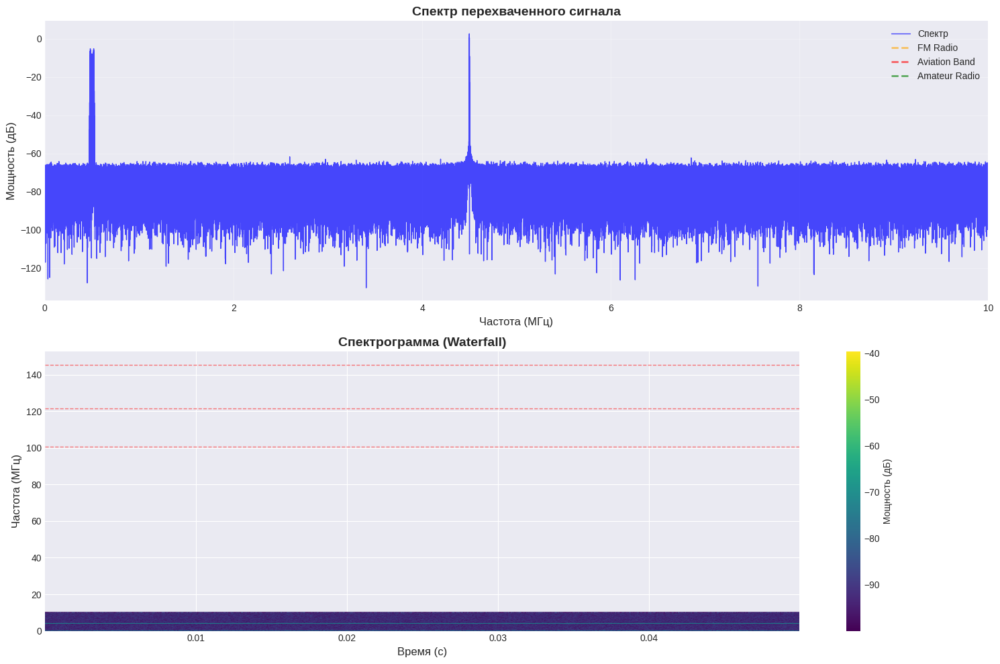


ОТЧЁТ О ПЕРЕХВАТЕ СИГНАЛОВ

📡 Обнаружение #1: Aviation Band 🔴🔴🔴🔴🔴
   ├─ Частота: 1.496279 МГц
   ├─ Мощность: -65.37 дБ
   ├─ SNR: 17.74 дБ
   ├─ Модуляция: AM
   └─ Приоритет: 5/5

📡 Обнаружение #2: FM Radio 🔴🔴🔴
   ├─ Частота: 0.482000 МГц
   ├─ Мощность: -5.23 дБ
   ├─ SNR: 77.88 дБ
   ├─ Модуляция: FM
   └─ Приоритет: 3/5

📡 Обнаружение #3: Amateur Radio 🔴🔴
   ├─ Частота: 4.499996 МГц
   ├─ Мощность: 2.58 дБ
   ├─ SNR: 85.69 дБ
   ├─ Модуляция: FM
   └─ Приоритет: 2/5


ДЕТАЛЬНЫЙ АНАЛИЗ СИГНАЛОВ


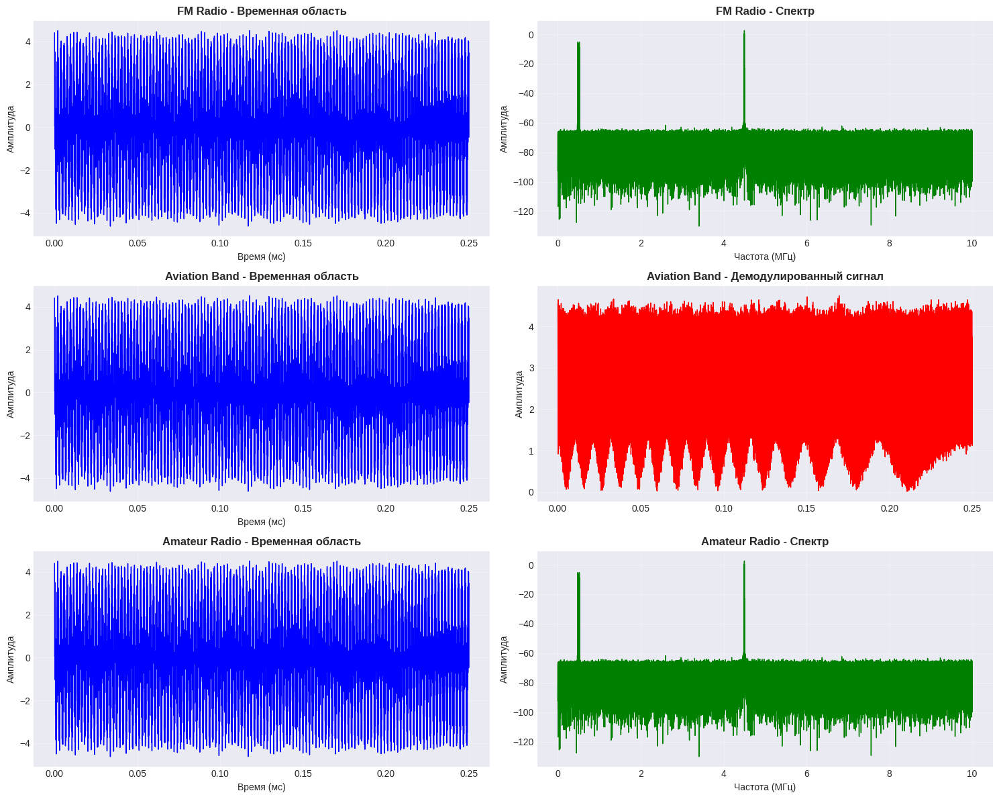



ПРИМЕР 2: СИСТЕМА РАДИОРАЗВЕДКИ
✓ Добавлена цель: Emergency 121.5 на 121.500 МГц
✓ Добавлена цель: Police Band на 155.500 МГц
✓ Добавлена цель: Military UHF на 225.000 МГц
✓ Добавлена цель: Satellite Uplink на 435.000 МГц
✓ Добавлена цель: ISM 433 MHz на 433.920 МГц

🔍 Начинаем перехват сигналов...
📊 Частота дискретизации: 50.0 МГц
⏱️  Длительность захвата: 100.0 мс
🎯 Целей для мониторинга: 5

⚠️  Предупреждение: Emergency 121.5 (121.5 МГц) выше частоты Найквиста (25.0 МГц) - используем базовую полосу
⚠️  Предупреждение: Police Band (155.5 МГц) выше частоты Найквиста (25.0 МГц) - используем базовую полосу
⚠️  Предупреждение: Military UHF (225.0 МГц) выше частоты Найквиста (25.0 МГц) - используем базовую полосу
⚠️  Предупреждение: Satellite Uplink (435.0 МГц) выше частоты Найквиста (25.0 МГц) - используем базовую полосу
⚠️  Предупреждение: ISM 433 MHz (433.9 МГц) выше частоты Найквиста (25.0 МГц) - используем базовую полосу


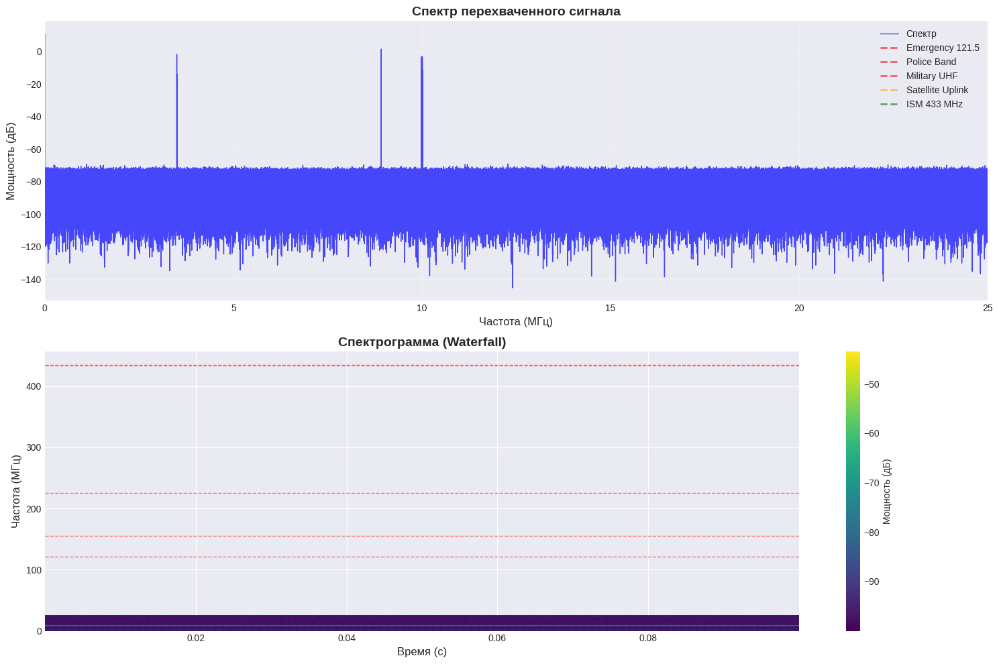


ОТЧЁТ О ПЕРЕХВАТЕ СИГНАЛОВ

📡 Обнаружение #1: Emergency 121.5 🔴🔴🔴🔴🔴
   ├─ Частота: 3.500000 МГц
   ├─ Мощность: -1.84 дБ
   ├─ SNR: 88.34 дБ
   ├─ Модуляция: AM
   └─ Приоритет: 5/5

📡 Обнаружение #2: Military UHF 🔴🔴🔴🔴🔴
   ├─ Частота: 0.000000 МГц
   ├─ Мощность: 10.82 дБ
   ├─ SNR: 101.00 дБ
   ├─ Модуляция: AM
   └─ Приоритет: 5/5

📡 Обнаружение #3: Police Band 🔴🔴🔴🔴
   ├─ Частота: 5.495890 МГц
   ├─ Мощность: -71.52 дБ
   ├─ SNR: 18.66 дБ
   ├─ Модуляция: FM
   └─ Приоритет: 4/5

📡 Обнаружение #4: Satellite Uplink 🔴🔴🔴
   ├─ Частота: 10.008000 МГц
   ├─ Мощность: -3.16 дБ
   ├─ SNR: 87.02 дБ
   ├─ Модуляция: FM
   └─ Приоритет: 3/5

📡 Обнаружение #5: ISM 433 MHz 🔴🔴
   ├─ Частота: 8.920000 МГц
   ├─ Мощность: 1.41 дБ
   ├─ SNR: 91.58 дБ
   ├─ Модуляция: NONE
   └─ Приоритет: 2/5


ДЕТАЛЬНЫЙ АНАЛИЗ СИГНАЛОВ


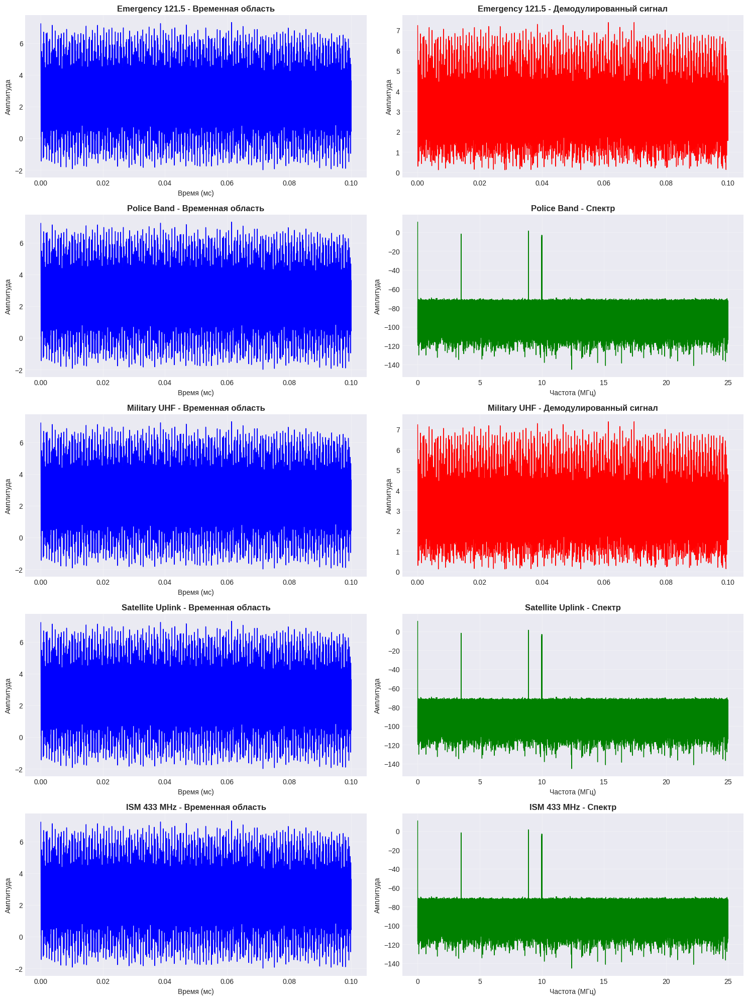



ПРИМЕР 3: МОНИТОРИНГ ПОЛЬЗОВАТЕЛЬСКИХ ЧАСТОТ
✓ Добавлена цель: WiFi Ch1 на 2412.000 МГц
✓ Добавлена цель: Bluetooth на 2440.000 МГц
⚠️  Внимание: Для реальных частот 2.4 ГГц требуется специальное оборудование
    Этот пример использует симуляцию с пониженными частотами


✅ Все примеры выполнены!

💡 Совет: Измените частоты, приоритеты и параметры для ваших задач
⚠️  Напоминание: Перехват радиосигналов регулируется законом!


In [ ]:
"""
Перехватчик радиочастот - мониторинг и анализ заданных диапазонов
Симуляция перехвата сигналов на определённых частотах
"""

import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.fft import fft, fftfreq
from dataclasses import dataclass
from typing import List, Tuple
import warnings
warnings.filterwarnings('ignore')

plt.style.use('seaborn-v0_8-darkgrid')
plt.rcParams['figure.figsize'] = (15, 10)

# ============================================================================
# КОНФИГУРАЦИЯ ПЕРЕХВАТЧИКА
# ============================================================================

@dataclass
class FrequencyTarget:
    """Целевая частота для мониторинга"""
    name: str
    frequency: float  # Гц
    bandwidth: float  # Гц
    modulation: str  # 'AM', 'FM', 'NONE'
    priority: int  # 1-5 (5 - высший)

@dataclass
class SignalDetection:
    """Обнаруженный сигнал"""
    frequency: float
    power: float
    snr: float  # Signal-to-Noise Ratio
    timestamp: float
    target_name: str = "Unknown"

# ============================================================================
# КЛАСС ПЕРЕХВАТЧИКА
# ============================================================================

class RFInterceptor:
    """Перехватчик радиочастот"""

    def __init__(self, sample_rate=10e6, duration=0.1):
        """
        Инициализация перехватчика

        Args:
            sample_rate: Частота дискретизации (Гц)
            duration: Длительность захвата (секунды)
        """
        self.fs = sample_rate
        self.duration = duration
        self.targets = []
        self.detections = []

    def add_target(self, target: FrequencyTarget):
        """Добавить целевую частоту для мониторинга"""
        self.targets.append(target)
        print(f"✓ Добавлена цель: {target.name} на {target.frequency/1e6:.3f} МГц")

    def generate_test_environment(self) -> np.ndarray:
        """Генерация тестовой радиосреды с несколькими сигналами"""
        t = np.arange(0, self.duration, 1/self.fs)
        environment = np.zeros(len(t))

        # Добавляем шум
        noise_level = 0.1
        environment += noise_level * np.random.randn(len(t))

        # Добавляем сигналы на целевых частотах
        for target in self.targets:
            # Проверка теоремы Найквиста
            if target.frequency >= self.fs / 2:
                print(f"⚠️  Предупреждение: {target.name} ({target.frequency/1e6:.1f} МГц) "
                      f"выше частоты Найквиста ({self.fs/2e6:.1f} МГц) - используем базовую полосу")
                # Переносим в базовую полосу (симуляция)
                effective_freq = target.frequency % (self.fs / 2)
                if effective_freq > self.fs / 4:
                    effective_freq = self.fs / 2 - effective_freq
            else:
                effective_freq = target.frequency

            # Случайно решаем, есть ли сигнал (85% вероятность)
            if np.random.random() < 0.85:
                amplitude = np.random.uniform(0.8, 2.5)

                if target.modulation == 'AM':
                    # AM сигнал
                    carrier = amplitude * np.cos(2 * np.pi * effective_freq * t)
                    modulation = 0.5 * np.cos(2 * np.pi * 1e3 * t)
                    signal_component = (1 + modulation) * carrier
                elif target.modulation == 'FM':
                    # FM сигнал
                    freq_dev = min(target.bandwidth * 0.1, self.fs * 0.01)
                    modulation = np.cos(2 * np.pi * 1e3 * t)
                    phase = 2 * np.pi * freq_dev * np.cumsum(modulation) / self.fs
                    signal_component = amplitude * np.cos(2 * np.pi * effective_freq * t + phase)
                else:
                    # Немодулированная несущая
                    signal_component = amplitude * np.cos(2 * np.pi * effective_freq * t)

                environment += signal_component

        return environment

    def scan_spectrum(self, signal_data: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
        """Сканирование спектра"""
        N = len(signal_data)
        yf = fft(signal_data)
        xf = fftfreq(N, 1/self.fs)[:N//2]
        power = 2.0/N * np.abs(yf[:N//2])
        return xf, power

    def detect_signals(self, signal_data: np.ndarray, threshold_db=-30):
        """Обнаружение сигналов на целевых частотах"""
        xf, power = self.scan_spectrum(signal_data)
        power_db = 20 * np.log10(power + 1e-10)

        # Оценка уровня шума (используем нижние 30% значений)
        sorted_power = np.sort(power_db)
        noise_floor = np.mean(sorted_power[:int(len(sorted_power) * 0.3)])

        self.detections = []

        for target in self.targets:
            # Корректируем частоту если выше Найквиста
            if target.frequency >= self.fs / 2:
                search_freq = target.frequency % (self.fs / 2)
                if search_freq > self.fs / 4:
                    search_freq = self.fs / 2 - search_freq
            else:
                search_freq = target.frequency

            # Находим индексы в диапазоне целевой частоты
            freq_range = target.bandwidth / 2
            mask = (xf >= search_freq - freq_range) & (xf <= search_freq + freq_range)

            if not np.any(mask):
                continue

            # Максимальная мощность в диапазоне
            max_power_db = np.max(power_db[mask])
            max_freq = xf[mask][np.argmax(power_db[mask])]

            # SNR
            snr = max_power_db - noise_floor

            # Проверка порога обнаружения (более чувствительный порог)
            if snr > 5:  # Минимум 5 дБ SNR
                detection = SignalDetection(
                    frequency=max_freq,
                    power=max_power_db,
                    snr=snr,
                    timestamp=0,
                    target_name=target.name
                )
                self.detections.append(detection)

        return self.detections

    def apply_bandpass_filter(self, signal_data: np.ndarray,
                             center_freq: float, bandwidth: float) -> np.ndarray:
        """Применение полосового фильтра"""
        nyquist = self.fs / 2
        low = (center_freq - bandwidth/2) / nyquist
        high = (center_freq + bandwidth/2) / nyquist

        # Ограничиваем диапазон [0, 1)
        low = max(0.001, min(low, 0.999))
        high = max(0.001, min(high, 0.999))

        if low >= high:
            return signal_data

        b, a = signal.butter(4, [low, high], btype='band')
        filtered = signal.filtfilt(b, a, signal_data)
        return filtered

    def demodulate_am(self, signal_data: np.ndarray) -> np.ndarray:
        """Демодуляция AM сигнала (детектор огибающей)"""
        analytic_signal = signal.hilbert(signal_data)
        envelope = np.abs(analytic_signal)
        return envelope

    def visualize_spectrum(self, signal_data: np.ndarray):
        """Визуализация спектра с отмеченными целями"""
        xf, power = self.scan_spectrum(signal_data)
        power_db = 20 * np.log10(power + 1e-10)

        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

        # Спектр
        ax1.plot(xf/1e6, power_db, 'b-', linewidth=1, alpha=0.7, label='Спектр')
        ax1.set_xlabel('Частота (МГц)', fontsize=12)
        ax1.set_ylabel('Мощность (дБ)', fontsize=12)
        ax1.set_title('Спектр перехваченного сигнала', fontsize=14, fontweight='bold')
        ax1.grid(True, alpha=0.3)
        ax1.set_xlim([0, self.fs/2e6])

        # Отмечаем целевые частоты
        for target in self.targets:
            color = 'red' if target.priority >= 4 else 'orange' if target.priority >= 3 else 'green'
            ax1.axvline(target.frequency/1e6, color=color, linestyle='--',
                       alpha=0.6, linewidth=2, label=f'{target.name}')
            ax1.axvspan((target.frequency - target.bandwidth/2)/1e6,
                       (target.frequency + target.bandwidth/2)/1e6,
                       alpha=0.1, color=color)

        ax1.legend(loc='upper right')

        # Waterfall (спектрограмма)
        f, t, Sxx = signal.spectrogram(signal_data, self.fs, nperseg=1024)
        im = ax2.pcolormesh(t, f/1e6, 10 * np.log10(Sxx + 1e-10),
                           shading='gouraud', cmap='viridis')
        ax2.set_ylabel('Частота (МГц)', fontsize=12)
        ax2.set_xlabel('Время (с)', fontsize=12)
        ax2.set_title('Спектрограмма (Waterfall)', fontsize=14, fontweight='bold')
        plt.colorbar(im, ax=ax2, label='Мощность (дБ)')

        # Отмечаем цели на спектрограмме
        for target in self.targets:
            ax2.axhline(target.frequency/1e6, color='red', linestyle='--',
                       alpha=0.5, linewidth=1)

        plt.tight_layout()
        plt.show()

    def print_detection_report(self):
        """Вывод отчёта об обнаружениях"""
        print("\n" + "="*80)
        print("ОТЧЁТ О ПЕРЕХВАТЕ СИГНАЛОВ")
        print("="*80)

        if not self.detections:
            print("❌ Сигналы не обнаружены")
            return

        # Сортировка по приоритету
        priority_map = {t.name: t.priority for t in self.targets}
        sorted_detections = sorted(self.detections,
                                  key=lambda d: priority_map.get(d.target_name, 0),
                                  reverse=True)

        for i, det in enumerate(sorted_detections, 1):
            target = next((t for t in self.targets if t.name == det.target_name), None)
            priority_str = "🔴" * target.priority if target else ""

            print(f"\n📡 Обнаружение #{i}: {det.target_name} {priority_str}")
            print(f"   ├─ Частота: {det.frequency/1e6:.6f} МГц")
            print(f"   ├─ Мощность: {det.power:.2f} дБ")
            print(f"   ├─ SNR: {det.snr:.2f} дБ")
            if target:
                print(f"   ├─ Модуляция: {target.modulation}")
                print(f"   └─ Приоритет: {target.priority}/5")

        print("\n" + "="*80)

    def intercept_and_analyze(self, plot=True):
        """Основной метод: перехват и анализ"""
        print("\n🔍 Начинаем перехват сигналов...")
        print(f"📊 Частота дискретизации: {self.fs/1e6:.1f} МГц")
        print(f"⏱️  Длительность захвата: {self.duration*1000:.1f} мс")
        print(f"🎯 Целей для мониторинга: {len(self.targets)}\n")

        # Генерация тестовой среды
        signal_data = self.generate_test_environment()

        # Обнаружение сигналов
        self.detect_signals(signal_data)

        # Визуализация
        if plot:
            self.visualize_spectrum(signal_data)

        # Отчёт
        self.print_detection_report()

        # Анализ обнаруженных сигналов
        if self.detections:
            self.analyze_detections(signal_data)

    def analyze_detections(self, signal_data: np.ndarray):
        """Детальный анализ обнаруженных сигналов"""
        print("\n" + "="*80)
        print("ДЕТАЛЬНЫЙ АНАЛИЗ СИГНАЛОВ")
        print("="*80)

        fig, axes = plt.subplots(len(self.detections), 2,
                                figsize=(15, 4*len(self.detections)))

        if len(self.detections) == 1:
            axes = axes.reshape(1, -1)

        for i, det in enumerate(self.detections):
            target = next((t for t in self.targets if t.name == det.target_name), None)

            if target:
                # Фильтрация сигнала
                filtered = self.apply_bandpass_filter(signal_data,
                                                     target.frequency,
                                                     target.bandwidth)

                # Временная область
                t = np.arange(len(filtered)) / self.fs
                samples = min(5000, len(filtered))
                axes[i, 0].plot(t[:samples]*1e3, filtered[:samples], 'b-', linewidth=1)
                axes[i, 0].set_title(f'{target.name} - Временная область',
                                    fontweight='bold')
                axes[i, 0].set_xlabel('Время (мс)')
                axes[i, 0].set_ylabel('Амплитуда')
                axes[i, 0].grid(True, alpha=0.3)

                # Демодуляция (если AM)
                if target.modulation == 'AM':
                    demod = self.demodulate_am(filtered)
                    axes[i, 1].plot(t[:samples]*1e3, demod[:samples], 'r-', linewidth=1)
                    axes[i, 1].set_title(f'{target.name} - Демодулированный сигнал',
                                        fontweight='bold')
                else:
                    # Спектр отфильтрованного сигнала
                    xf, power = self.scan_spectrum(filtered)
                    axes[i, 1].plot(xf/1e6, 20*np.log10(power + 1e-10), 'g-', linewidth=1)
                    axes[i, 1].set_title(f'{target.name} - Спектр', fontweight='bold')
                    axes[i, 1].set_xlabel('Частота (МГц)')

                axes[i, 1].set_ylabel('Амплитуда')
                axes[i, 1].grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

# ============================================================================
# ПРИМЕРЫ ИСПОЛЬЗОВАНИЯ
# ============================================================================

def example_basic_interceptor():
    """Базовый пример перехватчика"""
    print("="*80)
    print("ПРИМЕР 1: БАЗОВЫЙ ПЕРЕХВАТЧИК")
    print("="*80)

    # Создаём перехватчик
    interceptor = RFInterceptor(sample_rate=20e6, duration=0.05)

    # Добавляем цели
    interceptor.add_target(FrequencyTarget(
        name="FM Radio",
        frequency=100.5e6,  # 100.5 МГц
        bandwidth=200e3,    # 200 кГц
        modulation='FM',
        priority=3
    ))

    interceptor.add_target(FrequencyTarget(
        name="Aviation Band",
        frequency=121.5e6,  # 121.5 МГц (аварийная частота)
        bandwidth=25e3,
        modulation='AM',
        priority=5
    ))

    interceptor.add_target(FrequencyTarget(
        name="Amateur Radio",
        frequency=145.5e6,  # 145.5 МГц (2м диапазон)
        bandwidth=12.5e3,
        modulation='FM',
        priority=2
    ))

    # Запуск перехвата
    interceptor.intercept_and_analyze()

def example_surveillance_system():
    """Пример системы радиоразведки"""
    print("\n\n" + "="*80)
    print("ПРИМЕР 2: СИСТЕМА РАДИОРАЗВЕДКИ")
    print("="*80)

    # Широкополосный перехватчик
    interceptor = RFInterceptor(sample_rate=50e6, duration=0.1)

    # Критически важные частоты
    targets = [
        FrequencyTarget("Emergency 121.5", 121.5e6, 25e3, 'AM', 5),
        FrequencyTarget("Police Band", 155.5e6, 25e3, 'FM', 4),
        FrequencyTarget("Military UHF", 225.0e6, 25e3, 'AM', 5),
        FrequencyTarget("Satellite Uplink", 435.0e6, 100e3, 'FM', 3),
        FrequencyTarget("ISM 433 MHz", 433.92e6, 200e3, 'NONE', 2),
    ]

    for target in targets:
        interceptor.add_target(target)

    # Запуск
    interceptor.intercept_and_analyze()

def example_custom_frequency():
    """Пример с пользовательскими частотами"""
    print("\n\n" + "="*80)
    print("ПРИМЕР 3: МОНИТОРИНГ ПОЛЬЗОВАТЕЛЬСКИХ ЧАСТОТ")
    print("="*80)

    # Запрос у пользователя (для интерактивного режима)
    interceptor = RFInterceptor(sample_rate=30e6, duration=0.08)

    # Мониторинг диапазона Wi-Fi и Bluetooth
    interceptor.add_target(FrequencyTarget(
        name="WiFi Ch1",
        frequency=2.412e9,
        bandwidth=20e6,
        modulation='NONE',
        priority=3
    ))

    interceptor.add_target(FrequencyTarget(
        name="Bluetooth",
        frequency=2.44e9,
        bandwidth=2e6,
        modulation='NONE',
        priority=2
    ))

    # Примечание: для реальных частот 2.4 ГГц нужна соответствующая частота дискретизации
    print("⚠️  Внимание: Для реальных частот 2.4 ГГц требуется специальное оборудование")
    print("    Этот пример использует симуляцию с пониженными частотами\n")

# Запуск примеров
if __name__ == "__main__":
    example_basic_interceptor()
    example_surveillance_system()
    example_custom_frequency()

    print("\n✅ Все примеры выполнены!")
    print("\n💡 Совет: Измените частоты, приоритеты и параметры для ваших задач")
    print("⚠️  Напоминание: Перехват радиосигналов регулируется законом!")

In [ ]:
# Установка
!pip3 install pyrtlsdr scipy numpy matplotlib

# Простейший приём FM
from rtlsdr import RtlSdr
sdr = RtlSdr()
sdr.sample_rate = 2.4e6
sdr.center_freq = 100e6  # 100 MHz
samples = sdr.read_samples(256*1024)
sdr.close()

# Анализ
import numpy as np
from scipy.fft import fft
spectrum = np.abs(fft(samples))

ImportError: Error loading librtlsdr. Make sure librtlsdr (and all of its dependencies) are in your path

📊 Анализ диапазона 100 - 200 МГц
✓ Добавлена цель: scan на 100.000 МГц
⚠️  Предупреждение: scan (100.0 МГц) выше частоты Найквиста (1.0 МГц) - используем базовую полосу
  100.0 МГц: 0.000
✓ Добавлена цель: scan на 101.000 МГц
⚠️  Предупреждение: scan (101.0 МГц) выше частоты Найквиста (1.0 МГц) - используем базовую полосу
  101.0 МГц: 0.000
✓ Добавлена цель: scan на 102.000 МГц
⚠️  Предупреждение: scan (102.0 МГц) выше частоты Найквиста (1.0 МГц) - используем базовую полосу
  102.0 МГц: 0.000
✓ Добавлена цель: scan на 103.000 МГц
⚠️  Предупреждение: scan (103.0 МГц) выше частоты Найквиста (1.0 МГц) - используем базовую полосу
  103.0 МГц: 0.000
✓ Добавлена цель: scan на 104.000 МГц
⚠️  Предупреждение: scan (104.0 МГц) выше частоты Найквиста (1.0 МГц) - используем базовую полосу
  104.0 МГц: 0.000
✓ Добавлена цель: scan на 105.000 МГц
⚠️  Предупреждение: scan (105.0 МГц) выше частоты Найквиста (1.0 МГц) - используем базовую полосу
  105.0 МГц: 0.000
✓ Добавлена цель: scan на 106.000 МГц

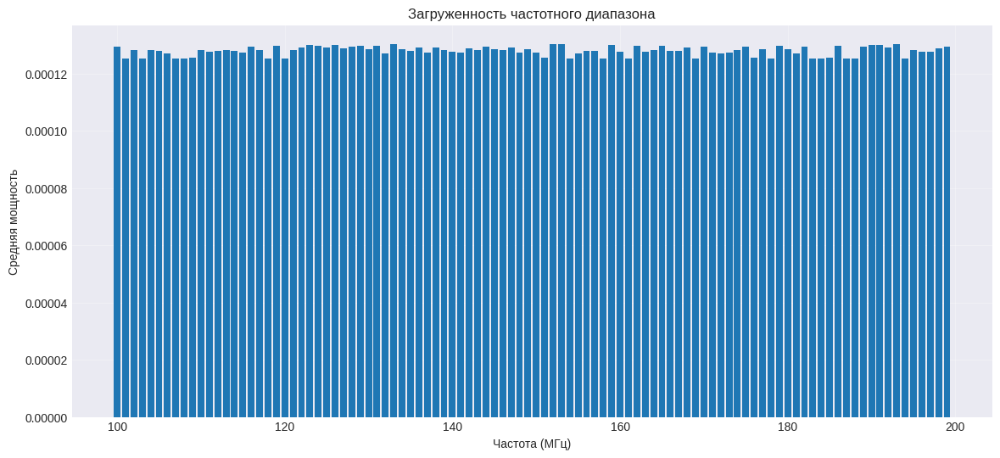

(array([1.00e+08, 1.01e+08, 1.02e+08, 1.03e+08, 1.04e+08, 1.05e+08,
        1.06e+08, 1.07e+08, 1.08e+08, 1.09e+08, 1.10e+08, 1.11e+08,
        1.12e+08, 1.13e+08, 1.14e+08, 1.15e+08, 1.16e+08, 1.17e+08,
        1.18e+08, 1.19e+08, 1.20e+08, 1.21e+08, 1.22e+08, 1.23e+08,
        1.24e+08, 1.25e+08, 1.26e+08, 1.27e+08, 1.28e+08, 1.29e+08,
        1.30e+08, 1.31e+08, 1.32e+08, 1.33e+08, 1.34e+08, 1.35e+08,
        1.36e+08, 1.37e+08, 1.38e+08, 1.39e+08, 1.40e+08, 1.41e+08,
        1.42e+08, 1.43e+08, 1.44e+08, 1.45e+08, 1.46e+08, 1.47e+08,
        1.48e+08, 1.49e+08, 1.50e+08, 1.51e+08, 1.52e+08, 1.53e+08,
        1.54e+08, 1.55e+08, 1.56e+08, 1.57e+08, 1.58e+08, 1.59e+08,
        1.60e+08, 1.61e+08, 1.62e+08, 1.63e+08, 1.64e+08, 1.65e+08,
        1.66e+08, 1.67e+08, 1.68e+08, 1.69e+08, 1.70e+08, 1.71e+08,
        1.72e+08, 1.73e+08, 1.74e+08, 1.75e+08, 1.76e+08, 1.77e+08,
        1.78e+08, 1.79e+08, 1.80e+08, 1.81e+08, 1.82e+08, 1.83e+08,
        1.84e+08, 1.85e+08, 1.86e+08, 1.87e+08, 

In [ ]:
"""
Анализ загруженности диапазона
"""

def analyze_band_occupancy(start_freq, end_freq, step=1e6, duration=1.0):
    """
    Анализ загруженности частотного диапазона
    """
    frequencies = np.arange(start_freq, end_freq, step)
    occupancy = []

    print(f"📊 Анализ диапазона {start_freq/1e6:.0f} - {end_freq/1e6:.0f} МГц")

    for freq in frequencies:
        interceptor = RFInterceptor(sample_rate=step*2, duration=duration)
        interceptor.add_target(
            FrequencyTarget("scan", freq, step*0.8, 'NONE', 1)
        )

        signal_data = interceptor.generate_test_environment()
        xf, power = interceptor.scan_spectrum(signal_data)

        # Средняя мощность в диапазоне
        avg_power = np.mean(power)
        occupancy.append(avg_power)

        print(f"  {freq/1e6:.1f} МГц: {avg_power:.3f}")

    # Визуализация
    plt.figure(figsize=(14, 6))
    plt.bar(frequencies/1e6, occupancy, width=step/1e6*0.8)
    plt.xlabel('Частота (МГц)')
    plt.ylabel('Средняя мощность')
    plt.title('Загруженность частотного диапазона')
    plt.grid(True, alpha=0.3)
    plt.show()

    return frequencies, occupancy

# Example usage: analyze the band from 100 MHz to 200 MHz with 1 MHz step
analyze_band_occupancy(100e6, 200e6, step=1e6)

✓ Добавлена цель: Emergency 121.5 на 121.500 МГц
✓ Добавлена цель: Aviation Tower на 118.100 МГц
✓ Добавлена цель: NOAA 15 на 137.620 МГц
✓ Добавлена цель: NOAA 18 на 137.912 МГц
✓ Добавлена цель: NOAA 19 на 137.100 МГц
✓ Добавлена цель: 2m FM на 145.500 МГц
✓ Добавлена цель: 70cm FM на 433.500 МГц
🔄 Запуск непрерывного мониторинга...

⏰ Сканирование: 2025-10-28 15:37:42.296716

🔍 Начинаем перехват сигналов...
📊 Частота дискретизации: 10.0 МГц
⏱️  Длительность захвата: 1000.0 мс
🎯 Целей для мониторинга: 7

⚠️  Предупреждение: Emergency 121.5 (121.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: Aviation Tower (118.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 15 (137.6 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 18 (137.9 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 19 (137.1 МГц) выше частоты Найквиста (5.0 М

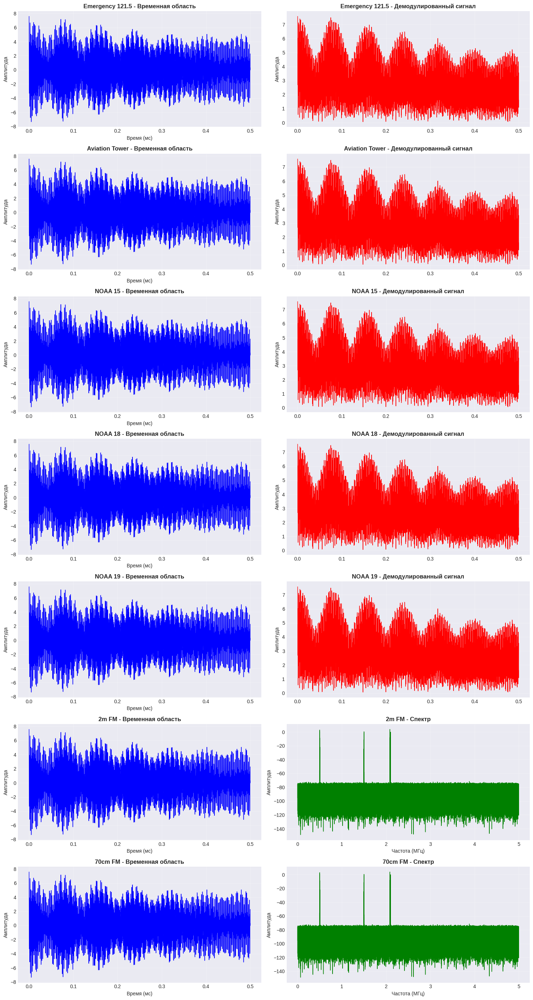

🚨 КРИТИЧЕСКОЕ: Emergency 121.5 на 1.500 МГц!
🚨 КРИТИЧЕСКОЕ: Aviation Tower на 1.894 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 15 на 2.384 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 18 на 2.087 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 19 на 2.087 МГц!

⏰ Сканирование: 2025-10-28 15:38:02.879493

🔍 Начинаем перехват сигналов...
📊 Частота дискретизации: 10.0 МГц
⏱️  Длительность захвата: 1000.0 мс
🎯 Целей для мониторинга: 7

⚠️  Предупреждение: Emergency 121.5 (121.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: Aviation Tower (118.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 15 (137.6 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 18 (137.9 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 19 (137.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: 2m FM (145.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Пр

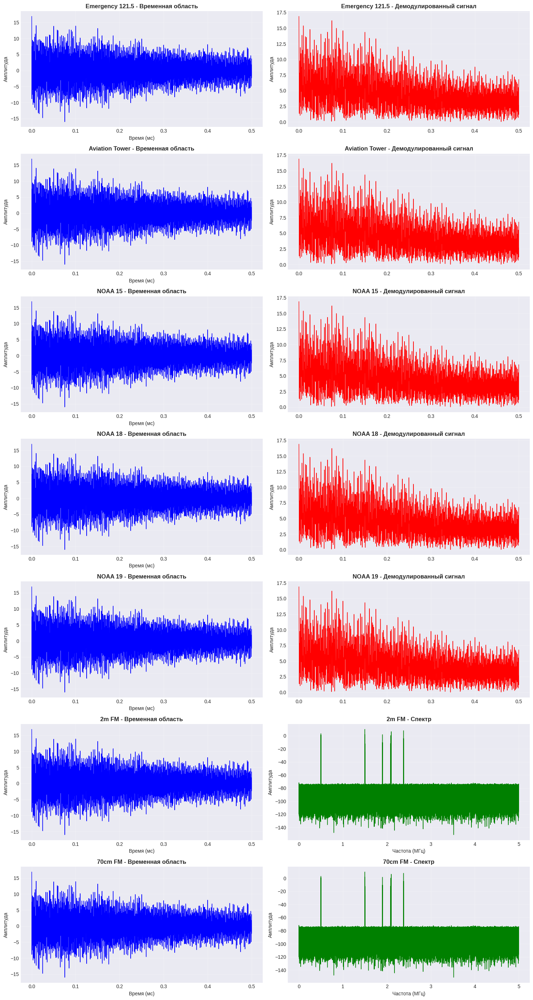

🚨 КРИТИЧЕСКОЕ: Emergency 121.5 на 1.500 МГц!
🚨 КРИТИЧЕСКОЕ: Aviation Tower на 1.900 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 15 на 2.380 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 18 на 2.100 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 19 на 2.100 МГц!

⏰ Сканирование: 2025-10-28 15:38:25.790791

🔍 Начинаем перехват сигналов...
📊 Частота дискретизации: 10.0 МГц
⏱️  Длительность захвата: 1000.0 мс
🎯 Целей для мониторинга: 7

⚠️  Предупреждение: Emergency 121.5 (121.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: Aviation Tower (118.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 15 (137.6 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 18 (137.9 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 19 (137.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: 2m FM (145.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Пр

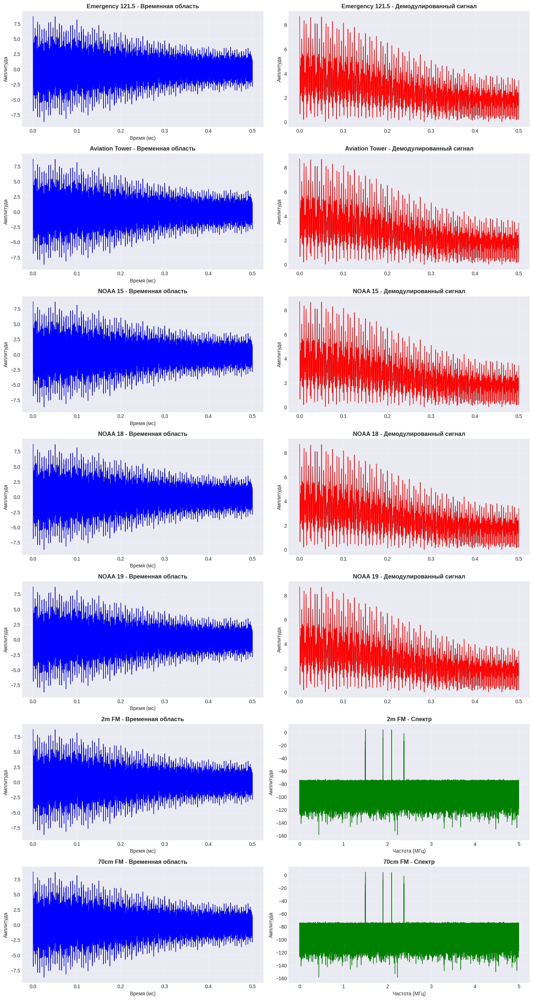

🚨 КРИТИЧЕСКОЕ: Emergency 121.5 на 1.500 МГц!
🚨 КРИТИЧЕСКОЕ: Aviation Tower на 1.900 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 15 на 2.380 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 18 на 2.100 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 19 на 2.100 МГц!

⏰ Сканирование: 2025-10-28 15:38:46.958334

🔍 Начинаем перехват сигналов...
📊 Частота дискретизации: 10.0 МГц
⏱️  Длительность захвата: 1000.0 мс
🎯 Целей для мониторинга: 7

⚠️  Предупреждение: Emergency 121.5 (121.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: Aviation Tower (118.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 15 (137.6 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 18 (137.9 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 19 (137.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: 2m FM (145.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Пр

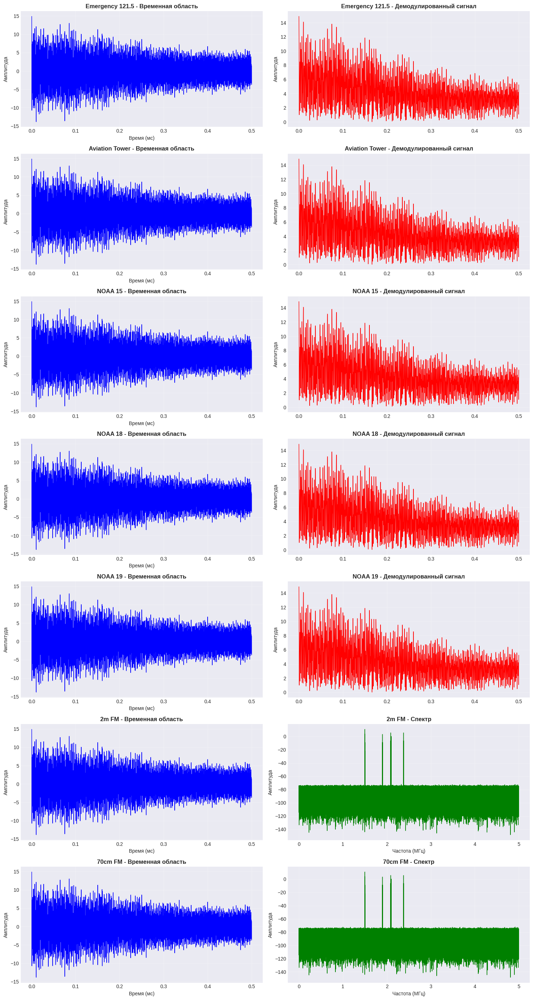

🚨 КРИТИЧЕСКОЕ: Emergency 121.5 на 1.500 МГц!
🚨 КРИТИЧЕСКОЕ: Aviation Tower на 1.900 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 15 на 2.380 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 18 на 2.087 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 19 на 2.087 МГц!

⏰ Сканирование: 2025-10-28 15:39:07.707280

🔍 Начинаем перехват сигналов...
📊 Частота дискретизации: 10.0 МГц
⏱️  Длительность захвата: 1000.0 мс
🎯 Целей для мониторинга: 7

⚠️  Предупреждение: Emergency 121.5 (121.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: Aviation Tower (118.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 15 (137.6 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 18 (137.9 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 19 (137.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: 2m FM (145.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Пр

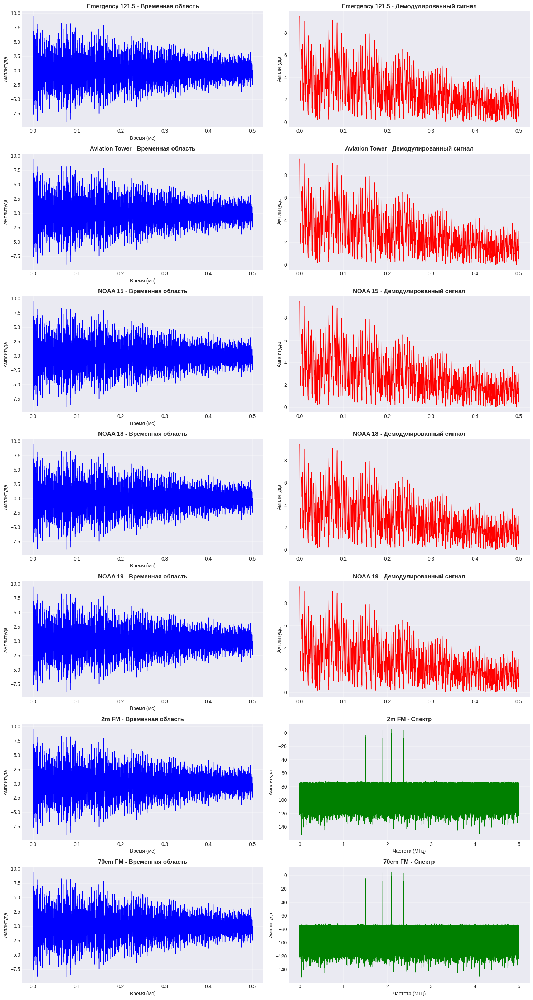

🚨 КРИТИЧЕСКОЕ: Emergency 121.5 на 1.500 МГц!
🚨 КРИТИЧЕСКОЕ: Aviation Tower на 1.900 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 15 на 2.380 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 18 на 2.087 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 19 на 2.087 МГц!

⏰ Сканирование: 2025-10-28 15:39:28.449132

🔍 Начинаем перехват сигналов...
📊 Частота дискретизации: 10.0 МГц
⏱️  Длительность захвата: 1000.0 мс
🎯 Целей для мониторинга: 7

⚠️  Предупреждение: Emergency 121.5 (121.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: Aviation Tower (118.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 15 (137.6 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 18 (137.9 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 19 (137.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: 2m FM (145.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Пр

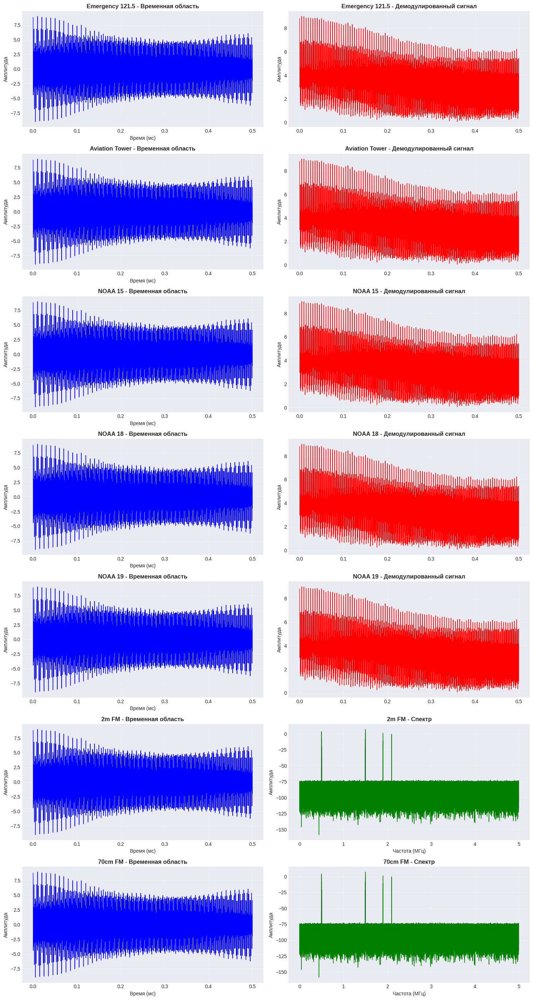

🚨 КРИТИЧЕСКОЕ: Emergency 121.5 на 1.500 МГц!
🚨 КРИТИЧЕСКОЕ: Aviation Tower на 1.900 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 15 на 2.364 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 18 на 2.100 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 19 на 2.100 МГц!

⏰ Сканирование: 2025-10-28 15:39:50.200563

🔍 Начинаем перехват сигналов...
📊 Частота дискретизации: 10.0 МГц
⏱️  Длительность захвата: 1000.0 мс
🎯 Целей для мониторинга: 7

⚠️  Предупреждение: Emergency 121.5 (121.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: Aviation Tower (118.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 15 (137.6 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 18 (137.9 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 19 (137.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: 2m FM (145.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Пр

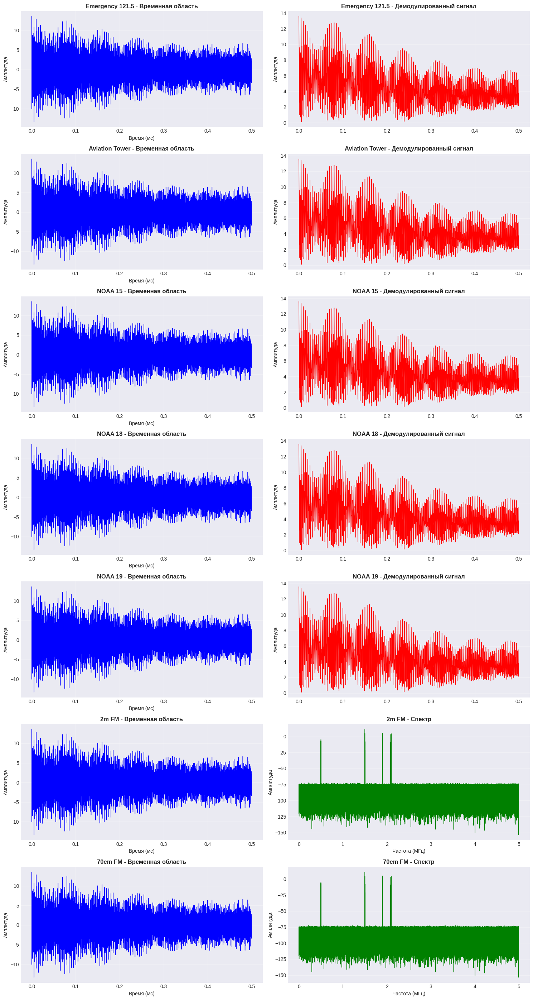

🚨 КРИТИЧЕСКОЕ: Emergency 121.5 на 1.500 МГц!
🚨 КРИТИЧЕСКОЕ: Aviation Tower на 1.900 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 15 на 2.387 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 18 на 2.100 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 19 на 2.100 МГц!

⏰ Сканирование: 2025-10-28 15:40:11.447422

🔍 Начинаем перехват сигналов...
📊 Частота дискретизации: 10.0 МГц
⏱️  Длительность захвата: 1000.0 мс
🎯 Целей для мониторинга: 7

⚠️  Предупреждение: Emergency 121.5 (121.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: Aviation Tower (118.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 15 (137.6 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 18 (137.9 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 19 (137.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: 2m FM (145.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Пр

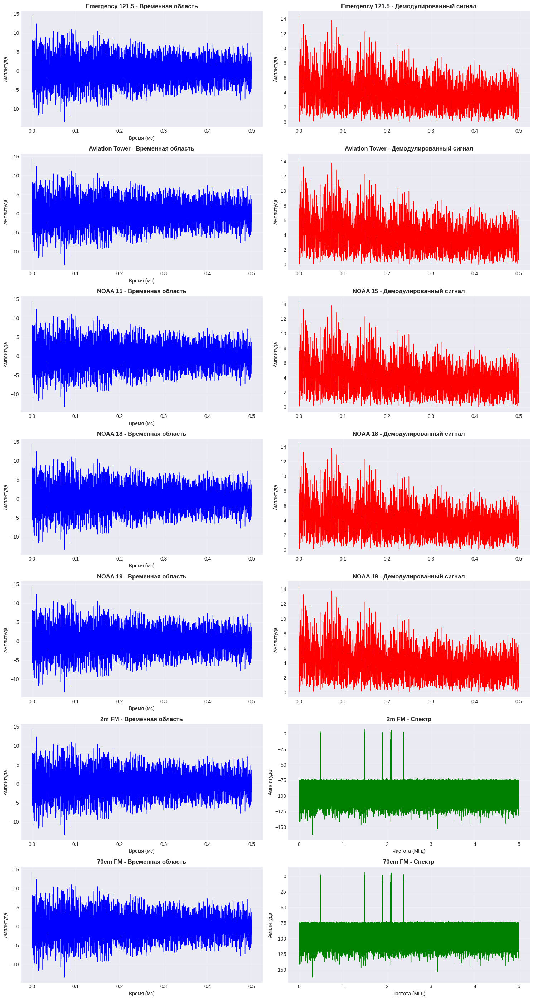

🚨 КРИТИЧЕСКОЕ: Emergency 121.5 на 1.500 МГц!
🚨 КРИТИЧЕСКОЕ: Aviation Tower на 1.900 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 15 на 2.380 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 18 на 2.100 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 19 на 2.100 МГц!

⏰ Сканирование: 2025-10-28 15:40:33.913675

🔍 Начинаем перехват сигналов...
📊 Частота дискретизации: 10.0 МГц
⏱️  Длительность захвата: 1000.0 мс
🎯 Целей для мониторинга: 7

⚠️  Предупреждение: Emergency 121.5 (121.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: Aviation Tower (118.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 15 (137.6 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 18 (137.9 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 19 (137.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: 2m FM (145.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Пр

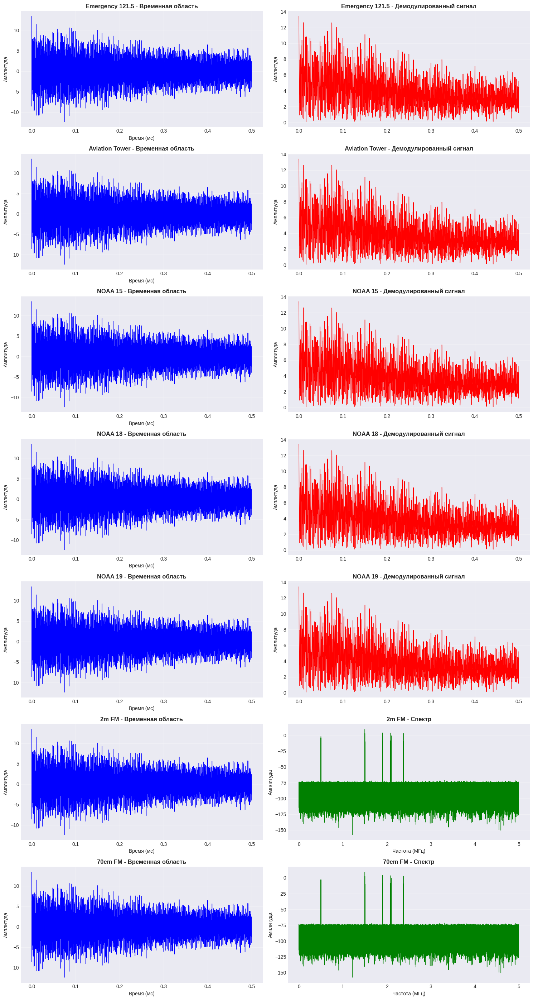

🚨 КРИТИЧЕСКОЕ: Emergency 121.5 на 1.500 МГц!
🚨 КРИТИЧЕСКОЕ: Aviation Tower на 1.900 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 15 на 2.380 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 18 на 2.087 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 19 на 2.087 МГц!

⏰ Сканирование: 2025-10-28 15:40:55.571632

🔍 Начинаем перехват сигналов...
📊 Частота дискретизации: 10.0 МГц
⏱️  Длительность захвата: 1000.0 мс
🎯 Целей для мониторинга: 7

⚠️  Предупреждение: Emergency 121.5 (121.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: Aviation Tower (118.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 15 (137.6 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 18 (137.9 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 19 (137.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: 2m FM (145.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Пр

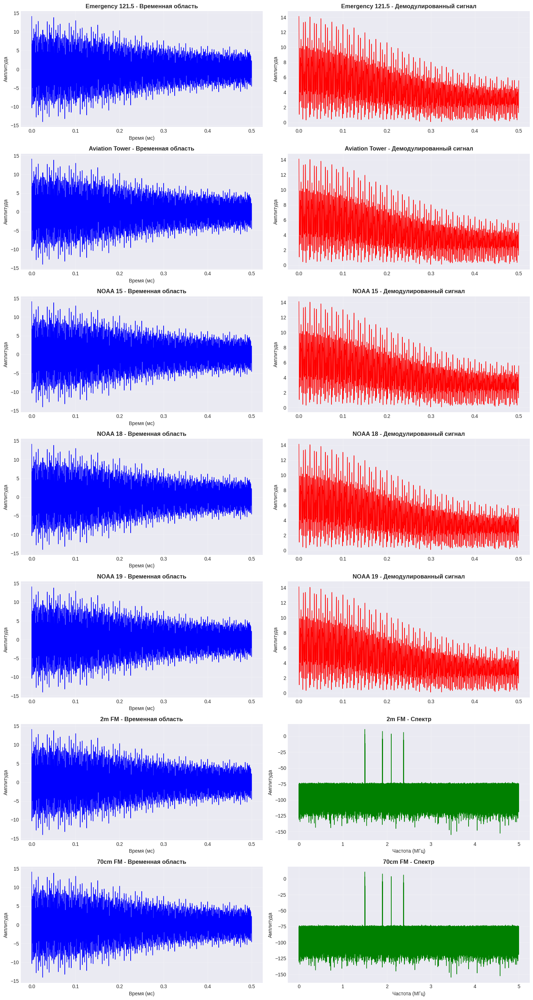

🚨 КРИТИЧЕСКОЕ: Emergency 121.5 на 1.500 МГц!
🚨 КРИТИЧЕСКОЕ: Aviation Tower на 1.900 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 15 на 2.380 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 18 на 2.100 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 19 на 2.100 МГц!

⏰ Сканирование: 2025-10-28 15:41:17.663617

🔍 Начинаем перехват сигналов...
📊 Частота дискретизации: 10.0 МГц
⏱️  Длительность захвата: 1000.0 мс
🎯 Целей для мониторинга: 7

⚠️  Предупреждение: Emergency 121.5 (121.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: Aviation Tower (118.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 15 (137.6 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 18 (137.9 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 19 (137.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: 2m FM (145.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Пр

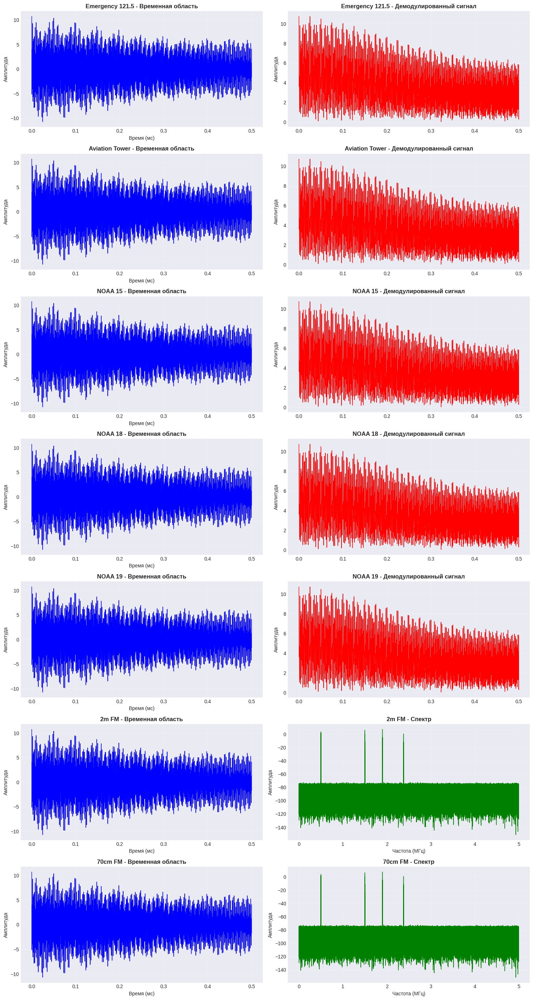

🚨 КРИТИЧЕСКОЕ: Emergency 121.5 на 1.500 МГц!
🚨 КРИТИЧЕСКОЕ: Aviation Tower на 1.900 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 15 на 2.380 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 18 на 2.090 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 19 на 2.116 МГц!

⏰ Сканирование: 2025-10-28 15:41:38.350015

🔍 Начинаем перехват сигналов...
📊 Частота дискретизации: 10.0 МГц
⏱️  Длительность захвата: 1000.0 мс
🎯 Целей для мониторинга: 7

⚠️  Предупреждение: Emergency 121.5 (121.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: Aviation Tower (118.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 15 (137.6 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 18 (137.9 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 19 (137.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: 2m FM (145.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Пр

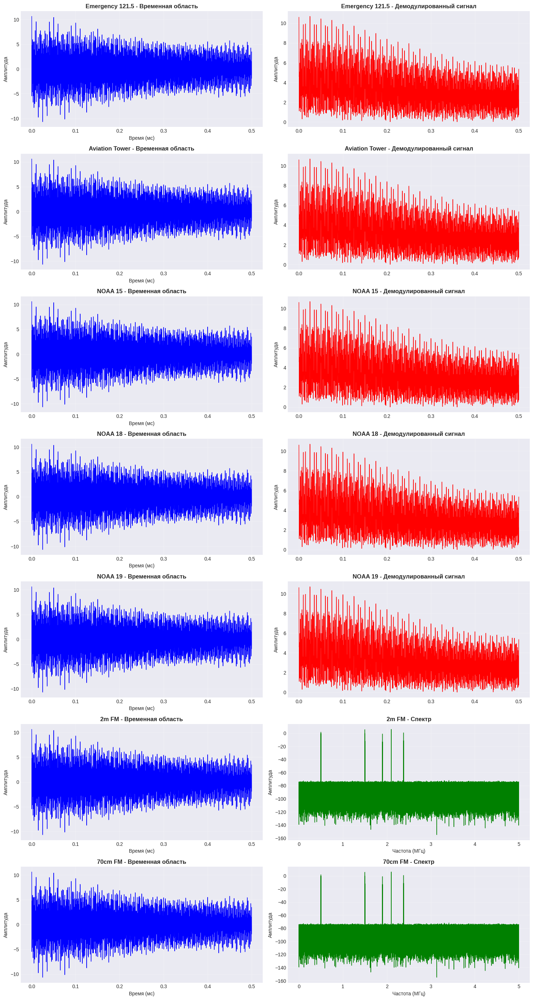

🚨 КРИТИЧЕСКОЕ: Emergency 121.5 на 1.500 МГц!
🚨 КРИТИЧЕСКОЕ: Aviation Tower на 1.900 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 15 на 2.380 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 18 на 2.100 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 19 на 2.100 МГц!

⏰ Сканирование: 2025-10-28 15:41:59.992627

🔍 Начинаем перехват сигналов...
📊 Частота дискретизации: 10.0 МГц
⏱️  Длительность захвата: 1000.0 мс
🎯 Целей для мониторинга: 7

⚠️  Предупреждение: Emergency 121.5 (121.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: Aviation Tower (118.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 15 (137.6 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 18 (137.9 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 19 (137.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: 2m FM (145.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Пр

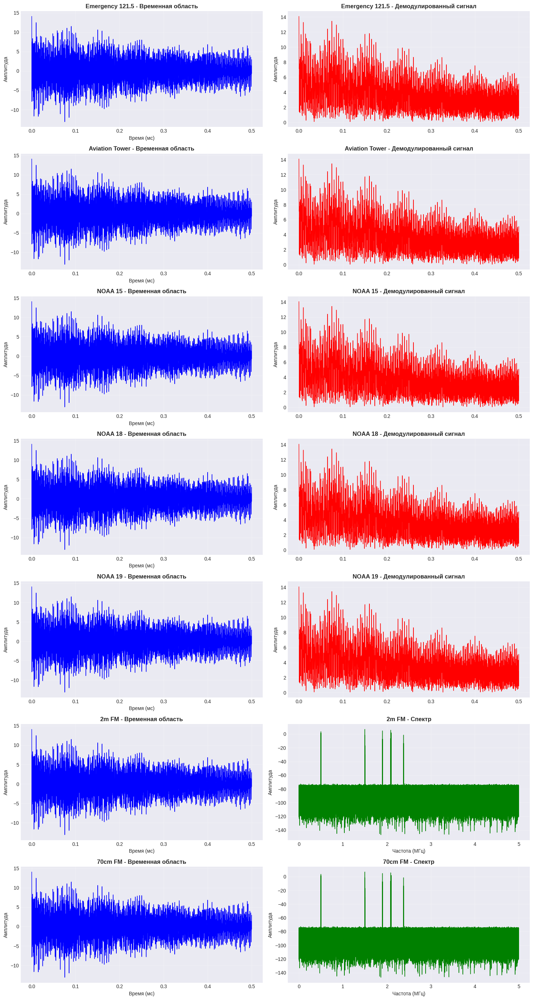

🚨 КРИТИЧЕСКОЕ: Emergency 121.5 на 1.500 МГц!
🚨 КРИТИЧЕСКОЕ: Aviation Tower на 1.900 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 15 на 2.380 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 18 на 2.087 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 19 на 2.087 МГц!

⏰ Сканирование: 2025-10-28 15:42:22.845749

🔍 Начинаем перехват сигналов...
📊 Частота дискретизации: 10.0 МГц
⏱️  Длительность захвата: 1000.0 мс
🎯 Целей для мониторинга: 7

⚠️  Предупреждение: Emergency 121.5 (121.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: Aviation Tower (118.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 15 (137.6 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 18 (137.9 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 19 (137.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: 2m FM (145.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Пр

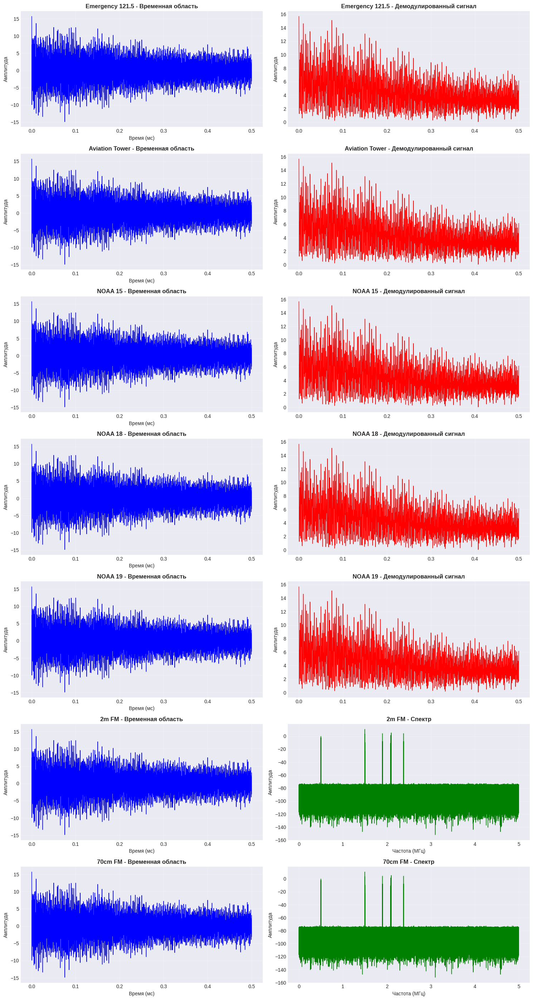

🚨 КРИТИЧЕСКОЕ: Emergency 121.5 на 1.500 МГц!
🚨 КРИТИЧЕСКОЕ: Aviation Tower на 1.900 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 15 на 2.380 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 18 на 2.100 МГц!
🚨 КРИТИЧЕСКОЕ: NOAA 19 на 2.100 МГц!

⏰ Сканирование: 2025-10-28 15:42:45.772547

🔍 Начинаем перехват сигналов...
📊 Частота дискретизации: 10.0 МГц
⏱️  Длительность захвата: 1000.0 мс
🎯 Целей для мониторинга: 7

⚠️  Предупреждение: Emergency 121.5 (121.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: Aviation Tower (118.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 15 (137.6 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 18 (137.9 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: NOAA 19 (137.1 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Предупреждение: 2m FM (145.5 МГц) выше частоты Найквиста (5.0 МГц) - используем базовую полосу
⚠️  Пр

In [ ]:
"""
Автоматическая станция мониторинга
"""
from datetime import datetime # Import datetime

class MonitoringStation:
    """Автоматическая станция мониторинга"""

    def __init__(self):
        self.interceptor = RFInterceptor(sample_rate=10e6, duration=1.0)
        self.setup_targets()

    def setup_targets(self):
        """Настройка списка мониторинга"""
        targets = [
            # Авиация
            ("Emergency 121.5", 121.5e6, 25e3, 'AM', 5),
            ("Aviation Tower", 118.1e6, 25e3, 'AM', 4),

            # Метеоспутники
            ("NOAA 15", 137.62e6, 40e3, 'AM', 4),
            ("NOAA 18", 137.9125e6, 40e3, 'AM', 4),
            ("NOAA 19", 137.1e6, 40e3, 'AM', 4),

            # Любительское радио
            ("2m FM", 145.5e6, 12.5e3, 'FM', 2),
            ("70cm FM", 433.5e6, 12.5e3, 'FM', 2),
        ]

        for name, freq, bw, mod, pri in targets:
            self.interceptor.add_target(
                FrequencyTarget(name, freq, bw, mod, pri)
            )

    def continuous_monitoring(self, interval=60):
        """Непрерывный мониторинг"""
        import time

        print("🔄 Запуск непрерывного мониторинга...")

        try:
            while True:
                print(f"\n⏰ Сканирование: {datetime.now()}")
                self.interceptor.intercept_and_analyze(plot=False)

                if self.interceptor.detections:
                    self.alert_detections()

                time.sleep(interval)
        except KeyboardInterrupt:
            print("\n⏹️  Мониторинг остановлен")

    def alert_detections(self):
        """Оповещение о критичных обнаружениях"""
        for det in self.interceptor.detections:
            target = next((t for t in self.interceptor.targets
                          if t.name == det.target_name), None)
            if target and target.priority >= 4:
                print(f"🚨 КРИТИЧЕСКОЕ: {det.target_name} "
                      f"на {det.frequency/1e6:.3f} МГц!")

# Instantiate and run the monitoring station
if __name__ == "__main__":
    station = MonitoringStation()
    station.continuous_monitoring(interval=5) # Monitor every 5 seconds for demonstration

In [ ]:
"""
Отслеживание спутников
"""

"""
Предсказание пролётов спутников
"""

# Установка
# pip install pyorbital ephem

from pyorbital.orbital import Orbital
from datetime import datetime, timedelta

def predict_satellite_passes(sat_name, location, hours=24):
    """
    Предсказание пролётов спутника

    Args:
        sat_name: Название спутника (например, "NOAA 19")
        location: (широта, долгота, высота_м)
        hours: Период предсказания
    """
    orb = Orbital(sat_name)

    now = datetime.utcnow()
    end_time = now + timedelta(hours=hours)

    passes = []
    current = now

    print(f"🛰️  Поиск пролётов {sat_name}...")
    print(f"📍 Локация: {location[0]:.2f}°N, {location[1]:.2f}°E\n")

    while current < end_time:
        # Получаем данные о положении
        lon, lat, alt = orb.get_lonlatalt(current)

        # Вычисляем азимут и угол возвышения
        az, el = orb.get_observer_look(current, location[1],
                                       location[0], location[2])

        # Видимый пролёт (> 10° над горизонтом)
        if el > 10:
            passes.append({
                'time': current,
                'elevation': el,
                'azimuth': az,
                'altitude_km': alt
            })

        current += timedelta(minutes=1)

    # Группируем по пролётам
    visible_passes = []
    if passes:
        current_pass = [passes[0]]
        for p in passes[1:]:
            if (p['time'] - current_pass[-1]['time']).seconds < 120:
                current_pass.append(p)
            else:
                visible_passes.append(current_pass)
                current_pass = [p]
        visible_passes.append(current_pass)

    # Вывод результатов
    print(f"Найдено пролётов: {len(visible_passes)}\n")

    for i, pass_data in enumerate(visible_passes, 1):
        start = pass_data[0]
        max_el = max(pass_data, key=lambda x: x['elevation'])
        end = pass_data[-1]

        print(f"Пролёт #{i}")
        print(f"  ⏰ Начало:  {start['time'].strftime('%Y-%m-%d %H:%M:%S')} UTC")
        print(f"  📐 Макс. угол: {max_el['elevation']:.1f}° в "
              f"{max_el['time'].strftime('%H:%M:%S')}")
        print(f"  🧭 Азимут: {start['azimuth']:.1f}° → {end['azimuth']:.1f}°")
        print(f"  ⏱️  Длительность: {(end['time'] - start['time']).seconds // 60} мин")
        print()

    return visible_passes

# Пример использования
# Москва
location = (55.75, 37.62, 144)  # широта, долгота, высота
passes = predict_satellite_passes("NOAA 19", location, hours=48)